# Developing an AI application

Going forward, AI algorithms will be incorporated into more and more everyday applications. For example, you might want to include an image classifier in a smart phone app. To do this, you'd use a deep learning model trained on hundreds of thousands of images as part of the overall application architecture. A large part of software development in the future will be using these types of models as common parts of applications. 

In this project, you'll train an image classifier to recognize different species of flowers. You can imagine using something like this in a phone app that tells you the name of the flower your camera is looking at. In practice you'd train this classifier, then export it for use in your application. We'll be using [this dataset](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html) of 102 flower categories, you can see a few examples below. 

<img src='assets/Flowers.png' width=500px>

The project is broken down into multiple steps:

* Load and preprocess the image dataset
* Train the image classifier on your dataset
* Use the trained classifier to predict image content

We'll lead you through each part which you'll implement in Python.

When you've completed this project, you'll have an application that can be trained on any set of labeled images. Here your network will be learning about flowers and end up as a command line application. But, what you do with your new skills depends on your imagination and effort in building a dataset. For example, imagine an app where you take a picture of a car, it tells you what the make and model is, then looks up information about it. Go build your own dataset and make something new.

First up is importing the packages you'll need. It's good practice to keep all the imports at the beginning of your code. As you work through this notebook and find you need to import a package, make sure to add the import up here.

In [2]:
from __future__ import print_function, division

import os
import numpy as np
import pandas as pd
import copy
import time
import random
import seaborn as sns
from collections import defaultdict

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torchsummary import summary
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
# By @smth
import sys
import psutil
import gc

def memReport():
   for obj in gc.get_objects():
       if torch.is_tensor(obj):
           print(type(obj), obj.size())

def cpuStats():
    print(sys.version)
    print("cpu:       {}%".format(psutil.cpu_percent())) 
    # print(psutil.virtual_memory())  # physical memory usage
    vml = list(zip(["total:    ", "available:", "percent:  ", "used:     ", "free:     "], list(psutil.virtual_memory())))
    for mem in vml:
        print("{} {:,}".format(mem[0], mem[1]))
    
    pid = os.getpid()
    py = psutil.Process(pid)
    memoryUse = py.memory_info()[0] / 2. ** 30  # memory use in GB...I think
    print('memory GB: {:0,.12f}'.format(memoryUse))

In [3]:
psutil.Process(os.getpid()).memory_info()

pmem(rss=666054656, vms=1421103104, num_page_faults=168795, peak_wset=666054656, wset=666054656, peak_paged_pool=27480360, paged_pool=27480360, peak_nonpaged_pool=2854152, nonpaged_pool=2852656, pagefile=1421103104, peak_pagefile=1421103104, private=1421103104)

In [4]:
cpuStats()

3.6.6 |Anaconda, Inc.| (default, Jun 28 2018, 11:27:44) [MSC v.1900 64 bit (AMD64)]
cpu:       10.8%
total:     17,052,966,912
available: 8,514,453,504
percent:   50.1
used:      8,538,513,408
free:      8,514,453,504
memory GB: 0.620300292969


https://pytorch.org/docs/stable/torchvision/models.html
```
alexnet
vgg11
vgg11_bn
vgg13
vgg13_bn
vgg16
vgg16_bn
vgg19
vgg19_bn
resnet18
resnet34
resnet50
resnet101
resnet152
squeezenet1_0
squeezenet1_1
densenet121
densenet169
densenet161
densenet201
inception_v3
```

### Working code for inceptionresnetv2
https://github.com/ahirner/pytorch-retraining/blob/master/retrain_benchmark_bees.ipynb

In [3]:
# https://github.com/Cadene/pretrained-models.pytorch
# pip install pretrainedmodels
import pretrainedmodels
print(pretrainedmodels.model_names)

['fbresnet152', 'bninception', 'resnext101_32x4d', 'resnext101_64x4d', 'inceptionv4', 'inceptionresnetv2', 'alexnet', 'densenet121', 'densenet169', 'densenet201', 'densenet161', 'resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'inceptionv3', 'squeezenet1_0', 'squeezenet1_1', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19_bn', 'vgg19', 'nasnetamobile', 'nasnetalarge', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn131', 'dpn107', 'xception', 'senet154', 'se_resnet50', 'se_resnet101', 'se_resnet152', 'se_resnext50_32x4d', 'se_resnext101_32x4d', 'cafferesnet101', 'pnasnet5large', 'polynet']


In [4]:
print(pretrainedmodels.pretrained_settings['inceptionresnetv2'])

{'imagenet': {'url': 'http://data.lip6.fr/cadene/pretrainedmodels/inceptionresnetv2-520b38e4.pth', 'input_space': 'RGB', 'input_size': [3, 299, 299], 'input_range': [0, 1], 'mean': [0.5, 0.5, 0.5], 'std': [0.5, 0.5, 0.5], 'num_classes': 1000}, 'imagenet+background': {'url': 'http://data.lip6.fr/cadene/pretrainedmodels/inceptionresnetv2-520b38e4.pth', 'input_space': 'RGB', 'input_size': [3, 299, 299], 'input_range': [0, 1], 'mean': [0.5, 0.5, 0.5], 'std': [0.5, 0.5, 0.5], 'num_classes': 1001}}


In [5]:
# see https://github.com/pytorch/pytorch/issues/7068
torch.manual_seed(0)
torch.cuda.manual_seed(0)
np.random.seed(0)
random.seed(0)
torch.backends.cudnn.deterministic=True

In [6]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
    
device = torch.device("cuda:0" if train_on_gpu else "cpu")

CUDA is available!  Training on GPU ...


In [7]:
def get_parameters(model, bias=False):
    import torch.nn as nn
    modules_skipped = (
        nn.ReLU,
        nn.MaxPool2d,
        nn.Dropout2d,
        nn.Sequential,
        torchfcn.models.FCN32s,
        torchfcn.models.FCN16s,
        torchfcn.models.FCN8s,
    )
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            if bias:
                yield m.bias
            else:
                yield m.weight
        elif isinstance(m, nn.ConvTranspose2d):
            # weight is frozen because it is just a bilinear upsampling
            if bias:
                assert m.bias is None
        elif isinstance(m, modules_skipped):
            continue
        else:
            raise ValueError('Unexpected module: %s' % str(m))

In [8]:
def imshow(image, ax=None, title=None, normalize=True):
    """Imshow for Tensor."""
    
    if isinstance(image, torch.Tensor): image = copy.deepcopy(image.numpy())
        
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    if isinstance(image, np.ndarray):     # type(image).__module__ == "numpy":    #
        image = image.transpose((1, 2, 0))
    else:
        image = image.numpy.transpose((1, 2, 0))
    
    
    if normalize:
        # Undo preprocessing
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
        image = np.clip(image, 0, 1)

    if title is not None:
        ax.set_title(title)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')
    
    return ax

In [45]:
def get_learning_rate(optimizer):
    lr=[]
    for param_group in optimizer.param_groups:
       lr +=[ param_group['lr'] ]
    return lr

## Load the data

Here you'll use `torchvision` to load the data ([documentation](http://pytorch.org/docs/0.3.0/torchvision/index.html)). You can [download the data here](https://s3.amazonaws.com/content.udacity-data.com/courses/nd188/flower_data.zip). The dataset is split into two parts, training and validation. For the training, you'll want to apply transformations such as random scaling, cropping, and flipping. This will help the network generalize leading to better performance. If you use a pre-trained network, you'll also need to make sure the input data is resized to 224x224 pixels as required by the networks.

The validation set is used to measure the model's performance on data it hasn't seen yet. For this you don't want any scaling or rotation transformations, but you'll need to resize then crop the images to the appropriate size.

The pre-trained networks available from `torchvision` were trained on the ImageNet dataset where each color channel was normalized separately. For both sets you'll need to normalize the means and standard deviations of the images to what the network expects. For the means, it's `[0.485, 0.456, 0.406]` and for the standard deviations `[0.229, 0.224, 0.225]`, calculated from the ImageNet images.  These values will shift each color channel to be centered at 0 and range from -1 to 1.

In [9]:
batch_size = 16 # 64
num_workers = 4

### See for test data : https://medium.com/@josh_2774/deep-learning-with-pytorch-9574e74d17ad

In [10]:
data_dir = 'flowers'   #'flower_data'
train_dir = data_dir + '/train'
valid_dir = data_dir + '/valid'
test_dir  = data_dir + '/test'

In [11]:
# If using inception_v3 models:
is_inception = False

# For all inception models using 343, as 341 with subsequent adjustment can result in < 299 
image_resize = 343 # int(299/224*256)  # 341
image_size = 299

In [12]:
# TODO: Define your transforms for the training and validation sets
# Original transforms.RandomResizedCrop(image_size, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
data_transforms = {
    'train': transforms.Compose([transforms.Resize(image_resize),
                                       transforms.RandomRotation(30),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05), 
                                       transforms.RandomResizedCrop(image_size, scale=(0.9, 1.0), ratio=(0.9, 1.1)),
                                #       transforms.RandomResizedCrop(image_size, scale=(0.96, 1.0), ratio=(0.95, 1.05)), 
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406],
                                                            [0.229, 0.224, 0.225])
                                ]),
    'valid': transforms.Compose([transforms.Resize(image_resize),
                                       transforms.CenterCrop(image_size),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406],
                                                            [0.229, 0.224, 0.225])
                                ]),
    'test' : transforms.Compose([transforms.Resize(image_resize),
                                      transforms.CenterCrop(image_size),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.485, 0.456, 0.406], 
                                                           [0.229, 0.224, 0.225])])    
}

In [13]:
# Load the datasets with ImageFolder and transforms
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'valid', 'test']}

class_names = image_datasets['train'].classes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid', 'test']}

In [14]:
# Define the dataloaders, using the image datasets
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False if x=='test' else True, 
                                              num_workers=num_workers)
              for x in ['train', 'valid', 'test']}

### Set weights to try and deal with class imbalance...

In [15]:
class_counts = defaultdict(int)
for _, c in image_datasets["train"].imgs:
    class_counts[c] += 1

class_weights = [1-(float(class_counts[class_id])/len(image_datasets["train"].imgs))
                 for class_id in range(len(image_datasets["train"].classes))]
class_weights = torch.FloatTensor(class_weights)
class_weights.to(device)

tensor([0.9959, 0.9942, 0.9947, 0.9925, 0.9945, 0.9896, 0.9889, 0.9942, 0.9933,
        0.9942, 0.9945, 0.9908, 0.9901, 0.9942, 0.9925, 0.9930, 0.9948, 0.9928,
        0.9890, 0.9947, 0.9948, 0.9950, 0.9945, 0.9916, 0.9905, 0.9945, 0.9907,
        0.9927, 0.9945, 0.9953, 0.9957, 0.9950, 0.9905, 0.9860, 0.9933, 0.9950,
        0.9933, 0.9918, 0.9852, 0.9925, 0.9847, 0.9889, 0.9950, 0.9760, 0.9907,
        0.9913, 0.9942, 0.9918, 0.9889, 0.9686, 0.9898, 0.9893, 0.9928, 0.9915,
        0.9860, 0.9924, 0.9869, 0.9915, 0.9947, 0.9870, 0.9945, 0.9927, 0.9936,
        0.9936, 0.9866, 0.9922, 0.9945, 0.9934, 0.9930, 0.9950, 0.9922, 0.9902,
        0.9882, 0.9776, 0.9783, 0.9855, 0.9873, 0.9687, 0.9829, 0.9948, 0.9893,
        0.9875, 0.9794, 0.9875, 0.9841, 0.9899, 0.9927, 0.9927, 0.9922, 0.9823,
        0.9766, 0.9937, 0.9899, 0.9910, 0.9919, 0.9948, 0.9799, 0.9846, 0.9890,
        0.9918, 0.9896, 0.9924], device='cuda:0')

In [19]:
class_counts

defaultdict(int,
            {0: 27,
             1: 38,
             2: 35,
             3: 49,
             4: 36,
             5: 68,
             6: 73,
             7: 38,
             8: 44,
             9: 38,
             10: 36,
             11: 60,
             12: 65,
             13: 38,
             14: 49,
             15: 46,
             16: 34,
             17: 47,
             18: 72,
             19: 35,
             20: 34,
             21: 33,
             22: 36,
             23: 55,
             24: 62,
             25: 36,
             26: 61,
             27: 48,
             28: 36,
             29: 31,
             30: 28,
             31: 33,
             32: 62,
             33: 92,
             34: 44,
             35: 33,
             36: 44,
             37: 54,
             38: 97,
             39: 49,
             40: 100,
             41: 73,
             42: 33,
             43: 157,
             44: 61,
             45: 57,
             46: 38,
    

In [20]:
class_weights

tensor([0.9959, 0.9942, 0.9947, 0.9925, 0.9945, 0.9896, 0.9889, 0.9942, 0.9933,
        0.9942, 0.9945, 0.9908, 0.9901, 0.9942, 0.9925, 0.9930, 0.9948, 0.9928,
        0.9890, 0.9947, 0.9948, 0.9950, 0.9945, 0.9916, 0.9905, 0.9945, 0.9907,
        0.9927, 0.9945, 0.9953, 0.9957, 0.9950, 0.9905, 0.9860, 0.9933, 0.9950,
        0.9933, 0.9918, 0.9852, 0.9925, 0.9847, 0.9889, 0.9950, 0.9760, 0.9907,
        0.9913, 0.9942, 0.9918, 0.9889, 0.9686, 0.9898, 0.9893, 0.9928, 0.9915,
        0.9860, 0.9924, 0.9869, 0.9915, 0.9947, 0.9870, 0.9945, 0.9927, 0.9936,
        0.9936, 0.9866, 0.9922, 0.9945, 0.9934, 0.9930, 0.9950, 0.9922, 0.9902,
        0.9882, 0.9776, 0.9783, 0.9855, 0.9873, 0.9687, 0.9829, 0.9948, 0.9893,
        0.9875, 0.9794, 0.9875, 0.9841, 0.9899, 0.9927, 0.9927, 0.9922, 0.9823,
        0.9766, 0.9937, 0.9899, 0.9910, 0.9919, 0.9948, 0.9799, 0.9846, 0.9890,
        0.9918, 0.9896, 0.9924])

In [21]:
dataset_sizes

{'train': 6552, 'valid': 818, 'test': 819}

In [22]:
len(class_names)

102

In [23]:
class_names[:10], class_names[-10:]

(['1', '10', '100', '101', '102', '11', '12', '13', '14', '15'],
 ['90', '91', '92', '93', '94', '95', '96', '97', '98', '99'])

### Label mapping

You'll also need to load in a mapping from category label to category name. You can find this in the file `cat_to_name.json`. It's a JSON object which you can read in with the [`json` module](https://docs.python.org/2/library/json.html). This will give you a dictionary mapping the integer encoded categories to the actual names of the flowers.

In [16]:
import json

with open('cat_to_name.json', 'r') as f:
    cat_to_name = json.load(f)

class_to_idx = dataloaders['train'].dataset.class_to_idx

idx_to_class =  {y:x for x,y in class_to_idx.items()}

In [25]:
for flower in sorted(cat_to_name.items(), key=lambda x: int(x[0])):
    print(flower)

('1', 'pink primrose')
('2', 'hard-leaved pocket orchid')
('3', 'canterbury bells')
('4', 'sweet pea')
('5', 'english marigold')
('6', 'tiger lily')
('7', 'moon orchid')
('8', 'bird of paradise')
('9', 'monkshood')
('10', 'globe thistle')
('11', 'snapdragon')
('12', "colt's foot")
('13', 'king protea')
('14', 'spear thistle')
('15', 'yellow iris')
('16', 'globe-flower')
('17', 'purple coneflower')
('18', 'peruvian lily')
('19', 'balloon flower')
('20', 'giant white arum lily')
('21', 'fire lily')
('22', 'pincushion flower')
('23', 'fritillary')
('24', 'red ginger')
('25', 'grape hyacinth')
('26', 'corn poppy')
('27', 'prince of wales feathers')
('28', 'stemless gentian')
('29', 'artichoke')
('30', 'sweet william')
('31', 'carnation')
('32', 'garden phlox')
('33', 'love in the mist')
('34', 'mexican aster')
('35', 'alpine sea holly')
('36', 'ruby-lipped cattleya')
('37', 'cape flower')
('38', 'great masterwort')
('39', 'siam tulip')
('40', 'lenten rose')
('41', 'barbeton daisy')
('42', 

In [26]:
class_to_idx['7']

69

In [27]:
idx_to_class[69]

'7'

In [28]:
[(k, v) for k, v in class_to_idx.items()][:10]

[('1', 0),
 ('10', 1),
 ('100', 2),
 ('101', 3),
 ('102', 4),
 ('11', 5),
 ('12', 6),
 ('13', 7),
 ('14', 8),
 ('15', 9)]

In [29]:
[(k, v) for k, v in idx_to_class.items()][:10]

[(0, '1'),
 (1, '10'),
 (2, '100'),
 (3, '101'),
 (4, '102'),
 (5, '11'),
 (6, '12'),
 (7, '13'),
 (8, '14'),
 (9, '15')]

# Data exploration

In [30]:
image_datasets["train"].imgs[20:35]

[('flowers\\train\\1\\image_06766.jpg', 0),
 ('flowers\\train\\1\\image_06767.jpg', 0),
 ('flowers\\train\\1\\image_06768.jpg', 0),
 ('flowers\\train\\1\\image_06770.jpg', 0),
 ('flowers\\train\\1\\image_06771.jpg', 0),
 ('flowers\\train\\1\\image_06772.jpg', 0),
 ('flowers\\train\\1\\image_06773.jpg', 0),
 ('flowers\\train\\10\\image_07086.jpg', 1),
 ('flowers\\train\\10\\image_07087.jpg', 1),
 ('flowers\\train\\10\\image_07088.jpg', 1),
 ('flowers\\train\\10\\image_07089.jpg', 1),
 ('flowers\\train\\10\\image_07091.jpg', 1),
 ('flowers\\train\\10\\image_07092.jpg', 1),
 ('flowers\\train\\10\\image_07093.jpg', 1),
 ('flowers\\train\\10\\image_07095.jpg', 1)]

In [31]:
images, labels = next(iter(dataloaders['train']))

In [32]:
images.size(0), labels.size(0)

(64, 64)

In [33]:
labels

tensor([ 74,  74,  71,  90,  54,  90,  40,  26,  22,  96,  14,  78, 100,   0,
         24,  49,  16,  86,  78,  73,  98,   5,  58,  31,  55,   6,  40,  39,
         35,  23,   8,  49,  54,  55,  91,  41,  46,  26,  93,  49,  43,  77,
         23,  35,  69,  84,  86,  91,  91,  43,  64,  52,  64,  63,  24,  90,
         56,  77,  89,  79,  21,  90,  58,  88])

In [34]:
idx_to_class[2], cat_to_name[idx_to_class[2]]

('100', 'blanket flower')

In [35]:
idx_to_class[0], cat_to_name[idx_to_class[0]]

('1', 'pink primrose')

In [36]:
idx_to_class[69], cat_to_name[idx_to_class[69]]

('7', 'moon orchid')

In [37]:
idx_to_class[66], cat_to_name[idx_to_class[66]]

('67', 'spring crocus')

In [38]:
class_to_idx['77'], cat_to_name['77']

(77, 'passion flower')

In [39]:
idx_to_class[77], cat_to_name[idx_to_class[77]]

('77', 'passion flower')

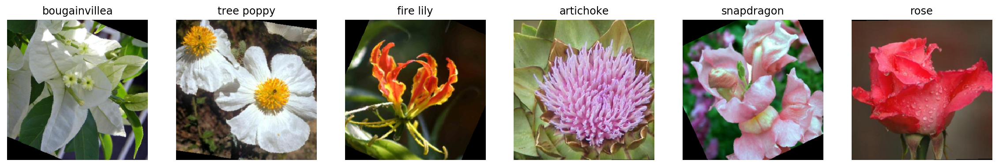

In [40]:
fig, axes = plt.subplots(figsize=(20, 6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, normalize=True)

In [41]:
image_datasets["valid"].imgs[:15]

[('flowers\\valid\\1\\image_06739.jpg', 0),
 ('flowers\\valid\\1\\image_06749.jpg', 0),
 ('flowers\\valid\\1\\image_06755.jpg', 0),
 ('flowers\\valid\\1\\image_06756.jpg', 0),
 ('flowers\\valid\\1\\image_06758.jpg', 0),
 ('flowers\\valid\\1\\image_06763.jpg', 0),
 ('flowers\\valid\\1\\image_06765.jpg', 0),
 ('flowers\\valid\\1\\image_06769.jpg', 0),
 ('flowers\\valid\\10\\image_07094.jpg', 1),
 ('flowers\\valid\\10\\image_07101.jpg', 1),
 ('flowers\\valid\\10\\image_07102.jpg', 1),
 ('flowers\\valid\\10\\image_07107.jpg', 1),
 ('flowers\\valid\\100\\image_07895.jpg', 2),
 ('flowers\\valid\\100\\image_07904.jpg', 2),
 ('flowers\\valid\\100\\image_07905.jpg', 2)]

In [42]:
images, labels = next(iter(dataloaders['valid']))

In [43]:
labels

tensor([ 93,  84,  75,  68,  59,  89,  56,  57,  89,  50,  10,  30,  73,  84,
         50,  81,  77,  14,  54,  33,  57,  87,  31, 101,  49,  95,  59,  99,
         86,  63,  48,  71,  47,  38,   5,  82,  64,  29,  81,  79,  56,  90,
         25,   3,  49,  71,  66,  81,  46,  29,   6,  32,   0, 101,  45,  40,
         85,   5,  83,  96,  96,  75,  13,  53])

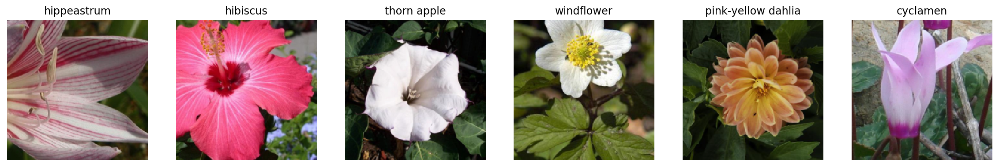

In [44]:
fig, axes = plt.subplots(figsize=(20,6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, normalize=True)

In [45]:
image_datasets["test"].imgs[:15]

[('flowers\\test\\1\\image_06743.jpg', 0),
 ('flowers\\test\\1\\image_06752.jpg', 0),
 ('flowers\\test\\1\\image_06754.jpg', 0),
 ('flowers\\test\\1\\image_06760.jpg', 0),
 ('flowers\\test\\1\\image_06764.jpg', 0),
 ('flowers\\test\\10\\image_07090.jpg', 1),
 ('flowers\\test\\10\\image_07104.jpg', 1),
 ('flowers\\test\\10\\image_07117.jpg', 1),
 ('flowers\\test\\100\\image_07896.jpg', 2),
 ('flowers\\test\\100\\image_07897.jpg', 2),
 ('flowers\\test\\100\\image_07899.jpg', 2),
 ('flowers\\test\\100\\image_07902.jpg', 2),
 ('flowers\\test\\100\\image_07926.jpg', 2),
 ('flowers\\test\\100\\image_07936.jpg', 2),
 ('flowers\\test\\100\\image_07938.jpg', 2)]

In [46]:
images, labels = next(iter(dataloaders['test']))

In [47]:
labels

tensor([ 0,  0,  0,  0,  0,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,
         3,  3,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  8,  8,  8,  9,
         9,  9,  9, 10, 10, 10, 11, 11, 11, 11])

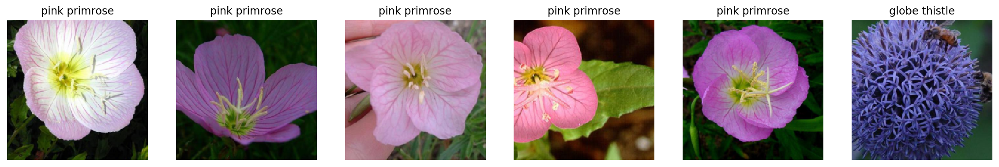

In [48]:
fig, axes = plt.subplots(figsize=(20,6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, normalize=True)

In [17]:
from pathlib import Path

def folders_in_path(path):
    if not Path.is_dir(path):
        raise ValueError("argument is not a directory")
    yield from filter(Path.is_dir, path.iterdir())

def folders_in_depth(path, depth):
    if 0 > depth:
        raise ValueError("depth smaller 0")
    if 0 == depth:
        yield from folders_in_path(path)
    else:
        for folder in folders_in_path(path):
            yield from folders_in_depth(folder, depth-1)

def files_in_path(path):
    if not Path.is_dir(path):
        raise ValueError("argument is not a directory")
    yield from filter(Path.is_file, path.iterdir())
    
def sum_file_size(filepaths):
    return sum([filep.stat().st_size for filep in filepaths])


In [50]:
files_per_folder = []
for folder in folders_in_depth(Path.cwd()/train_dir,0):
    files = list(files_in_path(folder))
    foldername = os.path.basename(os.path.normpath(folder))
    files_per_folder.append((foldername, cat_to_name[foldername], len(files)))
    
print("Training data files per class:")
print("-----------------------------------")
for flower in sorted(files_per_folder, key=lambda x: int(x[0])):
    print('{:<3} {:<25} {:>5}'.format(flower[0], flower[1], flower[2]))

Training data files per class:
-----------------------------------
1   pink primrose                27
2   hard-leaved pocket orchid    49
3   canterbury bells             36
4   sweet pea                    44
5   english marigold             54
6   tiger lily                   35
7   moon orchid                  33
8   bird of paradise             70
9   monkshood                    41
10  globe thistle                38
11  snapdragon                   68
12  colt's foot                  73
13  king protea                  38
14  spear thistle                44
15  yellow iris                  38
16  globe-flower                 36
17  purple coneflower            60
18  peruvian lily                65
19  balloon flower               38
20  giant white arum lily        46
21  fire lily                    34
22  pincushion flower            47
23  fritillary                   72
24  red ginger                   35
25  grape hyacinth               34
26  corn poppy                   

In [51]:
files_per_folder = []
for folder in folders_in_depth(Path.cwd()/valid_dir,0):
    files = list(files_in_path(folder))
    foldername = os.path.basename(os.path.normpath(folder))
    files_per_folder.append((foldername, cat_to_name[foldername], len(files)))
    
print("Validation data files per class:")
print("-----------------------------------")
for flower in sorted(files_per_folder, key=lambda x: int(x[0])):
    print('{:<3} {:<25} {:>5}'.format(flower[0], flower[1], flower[2]))

Validation data files per class:
-----------------------------------
1   pink primrose                 8
2   hard-leaved pocket orchid     6
3   canterbury bells              2
4   sweet pea                     6
5   english marigold              7
6   tiger lily                    1
7   moon orchid                   1
8   bird of paradise              5
9   monkshood                     3
10  globe thistle                 4
11  snapdragon                   10
12  colt's foot                   5
13  king protea                   5
14  spear thistle                 1
15  yellow iris                   7
16  globe-flower                  2
17  purple coneflower            16
18  peruvian lily                11
19  balloon flower                4
20  giant white arum lily         7
21  fire lily                     4
22  pincushion flower             8
23  fritillary                   12
24  red ginger                    5
25  grape hyacinth                2
26  corn poppy                 

In [52]:
files_per_folder = []
for folder in folders_in_depth(Path.cwd()/test_dir,0):
    files = list(files_in_path(folder))
    foldername = os.path.basename(os.path.normpath(folder))
    files_per_folder.append((foldername, cat_to_name[foldername], len(files)))
    
print("Testing data files per class:")
print("-----------------------------------")
for flower in sorted(files_per_folder, key=lambda x: int(x[0])):
    print('{:<3} {:<25} {:>5}'.format(flower[0], flower[1], flower[2]))

Testing data files per class:
-----------------------------------
1   pink primrose                 5
2   hard-leaved pocket orchid     5
3   canterbury bells              2
4   sweet pea                     6
5   english marigold              4
6   tiger lily                    9
7   moon orchid                   6
8   bird of paradise             10
9   monkshood                     2
10  globe thistle                 3
11  snapdragon                    9
12  colt's foot                   9
13  king protea                   6
14  spear thistle                 3
15  yellow iris                   4
16  globe-flower                  3
17  purple coneflower             9
18  peruvian lily                 6
19  balloon flower                7
20  giant white arum lily         3
21  fire lily                     2
22  pincushion flower             4
23  fritillary                    7
24  red ginger                    2
25  grape hyacinth                5
26  corn poppy                    

# Building and training the classifier

Now that the data is ready, it's time to build and train the classifier. As usual, you should use one of the pretrained models from `torchvision.models` to get the image features. Build and train a new feed-forward classifier using those features.

We're going to leave this part up to you. If you want to talk through it with someone, chat with your fellow students! You can also ask questions on the forums or join the instructors in office hours.

Refer to [the rubric](https://review.udacity.com/#!/rubrics/1663/view) for guidance on successfully completing this section. Things you'll need to do:

* Load a [pre-trained network](http://pytorch.org/docs/master/torchvision/models.html) (If you need a starting point, the VGG networks work great and are straightforward to use)
* Define a new, untrained feed-forward network as a classifier, using ReLU activations and dropout
* Train the classifier layers using backpropagation using the pre-trained network to get the features
* Track the loss and accuracy on the validation set to determine the best hyperparameters

We've left a cell open for you below, but use as many as you need. Our advice is to break the problem up into smaller parts you can run separately. Check that each part is doing what you expect, then move on to the next. You'll likely find that as you work through each part, you'll need to go back and modify your previous code. This is totally normal!

When training make sure you're updating only the weights of the feed-forward network. You should be able to get the validation accuracy above 70% if you build everything right. Make sure to try different hyperparameters (learning rate, units in the classifier, epochs, etc) to find the best model. Save those hyperparameters to use as default values in the next part of the project.

### Example code

### Test inceptionresnetv2

In [53]:
model_name = 'inceptionresnetv2' # could be fbresnet152 or inceptionresnetv2 or nasnetalarge
model_irnv2 = pretrainedmodels.__dict__[model_name](num_classes=1000, pretrained='imagenet')
model_irnv2

InceptionResNetV2(
  (conv2d_1a): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2a): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2b): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2d_3b): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_4a): 

In [54]:
list(model_irnv2.children())

[BasicConv2d(
   (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
   (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU()
 ), BasicConv2d(
   (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
   (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU()
 ), BasicConv2d(
   (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU()
 ), MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False), BasicConv2d(
   (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
   (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU()
 ), BasicConv2d(
   (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
   (bn): BatchNorm2d(192, eps=0.0

In [55]:
list(model_irnv2.children())[-2:]

[AvgPool2d(kernel_size=8, stride=8, padding=0),
 Linear(in_features=1536, out_features=1000, bias=True)]

### FASTAI CNN head structure
[What goes on behind in the fastai library?](https://forums.fast.ai/t/lesson-1-learner-what-goes-on-behind-in-the-fastai-library/29346)  
[What is the distinct usage of the AdaptiveConcatPool2d layer?](https://forums.fast.ai/t/what-is-the-distinct-usage-of-the-adaptiveconcatpool2d-layer/7600/3)

In resnet FASTAI replaces the fc layer with this:
```
(8): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=(1, 1))
    (mp): AdaptiveMaxPool2d(output_size=(1, 1))
  )
  (9): Flatten()
  (10): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): Dropout(p=0.25)
  (12): Linear(in_features=4096, out_features=512, bias=True)
  (13): ReLU()
  (14): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (15): Dropout(p=0.5)
  (16): Linear(in_features=512, out_features=102, bias=True)
  (17): LogSoftmax()
)

```
The inceptionresnetv2 (learnIrnv2_1) is like this:
```
Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (1): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (2): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (5): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (6): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Mixed_5b( ....
  )
  (8): Sequential( ....
  )
  (9): Mixed_6a(  ....
  )
  (10): Sequential(  ....
  )
  (11): Mixed_7a(  ....
  )
  (12): Sequential(  ....
  )
  (13): Block8(  ....
  )
  (14): BasicConv2d(
    (conv): Conv2d(2080, 1536, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(1536, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (15): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=(1, 1))
    (mp): AdaptiveMaxPool2d(output_size=(1, 1))
  )
  (16): Flatten()
  (17): BatchNorm1d(3072, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (18): Dropout(p=0.25)
  (19): Linear(in_features=3072, out_features=512, bias=True)
  (20): ReLU()
  (21): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (22): Dropout(p=0.5)
  (23): Linear(in_features=512, out_features=102, bias=True)
  (24): LogSoftmax()
)
```

In [18]:
# From fastai...
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=None):
        super().__init__()
        sz = sz or (1,1)
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

In [19]:
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return x

In [58]:
def get_resnet_model(modelname='resnet50', swap=False, sm=False):
    if modelname == 'resnet18':
        model = models.resnet18(pretrained=True)   
    elif modelname == 'resnet34':    
        model = models.resnet34(pretrained=True)   
    elif modelname == 'resnet50':    
        model = models.resnet50(pretrained=True)
    elif modelname == 'resnet101':    
        model = models.resnet101(pretrained=True)
    elif modelname == 'resnet152':    
        model = models.resnet152(pretrained=True)
    else:
        model = models.resnet50(pretrained=True)
        
    for param in model.parameters():
        param.requires_grad = False    
        
    clf_input_size = model.fc.in_features
    clf_output_size = 102 # len(class_names)
    nf = clf_input_size * 2 # For flattening ...
    
    if swap==True:
        # swapping last 2 layers for new ones - adaptive max pooling and more layers
        # per the fastai resnet implementation...
        Resnetlayers = []
        Resnetlayers.append(AdaptiveConcatPool2d())
        Resnetlayers.append(Flatten())
        Resnetlayers.append(nn.BatchNorm1d(nf, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=nf, out_features=512, bias=True))
        Resnetlayers.append(nn.ReLU())
        Resnetlayers.append(nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=512, out_features=clf_output_size, bias=True))        
        if sm==True:
            Resnetlayers.append(nn.LogSoftmax())
            
        Resnetlist = list(model.children())[:-2] + Resnetlayers
        model = torch.nn.Sequential(*Resnetlist)
    else:    
        # standard replacing the fc layer to suit the number of classes
        classifier = nn.Linear(clf_input_size, clf_output_size)
        model.fc = classifier

    model.class_to_idx = class_to_idx
    
    return model       

In [20]:
def get_inceptionresnetv2_model(swap=False, sm=False):
    model = pretrainedmodels.__dict__['inceptionresnetv2'](num_classes=1000, pretrained='imagenet')
    
    for param in model.parameters():
        param.requires_grad = False    
        
    clf_input_size = model.last_linear.in_features
    clf_output_size = 102 # len(class_names)
    nf = clf_input_size * 2 # For flattening ...
    
    if swap==True:
        # swapping last 2 layers for new ones - adaptive max pooling and more layers
        # per the fastai resnet implementation...
        ClfLayers = []
        ClfLayers.append(AdaptiveConcatPool2d())
        ClfLayers.append(Flatten())
        ClfLayers.append(nn.BatchNorm1d(nf, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        ClfLayers.append(nn.Dropout(p=0.25))
        ClfLayers.append(nn.Linear(in_features=nf, out_features=512, bias=True))
        ClfLayers.append(nn.ReLU())
        ClfLayers.append(nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        ClfLayers.append(nn.Dropout(p=0.25))
        ClfLayers.append(nn.Linear(in_features=512, out_features=clf_output_size, bias=True))        
        if sm==True:
            ClfLayers.append(nn.LogSoftmax())
            
        ClfList = list(model.children())[:-2] + ClfLayers
        model = torch.nn.Sequential(*ClfList)
    else:
        classifier = nn.Linear(clf_input_size, clf_output_size)
        model.last_linear = classifier
        
    model.class_to_idx = class_to_idx
    
    return model  

model_name = ""

## Inceptionnetv2 with one fully connected layer replacement

In [60]:
del model

In [21]:
model_name = "inceptionresnetv2"

In [22]:
model = get_inceptionresnetv2_model(swap=True)

In [23]:
model = model.to(device)

In [64]:
print(model)

Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (1): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (2): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (5): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3,

)


### Alternative uses of the loss function, with and without weights

In [24]:
# For the Resnet50 the replacement fc has no softmax defined so use CrossEntropyLoss
use_weights = True

# Passing in class_weights previously determined
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device), reduction='sum') #size_average=False

In [66]:
use_weights = False
criterion = nn.CrossEntropyLoss()

In [25]:
use_weights

True

In [68]:
learning_rate=0.001

In [35]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [70]:
is_inception

False

### Multiple learning rates

https://discuss.pytorch.org/t/different-learning-rates-within-a-model/1307  
https://stackoverflow.com/questions/51801648/how-to-apply-layer-wise-learning-rate-in-pytorch  
https://pytorch.org/docs/stable/optim.html
```
from torch.optim import Adam

model = SomeKindOfModel()

optim = Adam(
    [
        {"params": model.fc.parameters(), "lr": 1e-3},
        {"params": model.agroupoflayer.parameters()},
        {"params": model.lastlayer.parameters(), "lr": 4e-2},
    ],
    lr=5e-4,
)
```
#### For the resnet50 model with replacement layer there can be three groups:
```
model[:6].parameters()
model[6:8].parameters()
model[9:].parameters()
```

In [62]:
# Decay LR by a factor of 0.1 every 14 epochs (9 for inception)
multistep = False
OnPlateau = False

# Decay LR by a factor of 0.1 every 14 epochs (9 for inception)
if OnPlateau == True:
    # https://pytorch.org/docs/stable/optim.html#torch.optim.lr_scheduler.ReduceLROnPlateau
    exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, 
                                                      verbose=True, threshold=0.0001, threshold_mode='rel', 
                                                      cooldown=0, min_lr=0, eps=1e-08)  
elif multistep==True:
    #exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [20, 30, 35], gamma=0.1)
    exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [9, 18, 27], gamma=0.1)

else:
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, 9, gamma=0.1)

In [72]:
exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [5, 15, 25], gamma=0.1)

In [73]:
??exp_lr_scheduler

In [74]:
exp_lr_scheduler.get_lr()

[0.001]

In [75]:
optimizer.param_groups

[{'params': [Parameter containing:
   tensor([[[[-1.6336e-01, -5.6482e-01, -4.2228e-02],
             [ 1.5276e-01, -1.1886e-01,  1.8823e-01],
             [ 1.5762e-01,  6.1291e-02,  1.8545e-01]],
   
            [[ 1.7639e-02,  6.4324e-02, -4.9329e-02],
             [-7.0132e-02, -1.5228e-02, -1.1563e-01],
             [-8.7281e-02, -4.8946e-02, -1.3242e-01]],
   
            [[ 6.2231e-03,  2.1247e-02,  3.9204e-03],
             [-4.0202e-02, -2.4121e-02, -1.4786e-02],
             [-5.4107e-02, -2.0414e-02, -1.0773e-02]]],
   
   
           [[[-6.1709e-03, -3.6028e-02, -7.2051e-02],
             [-8.2202e-02, -1.0421e-01, -3.1795e-01],
             [-1.4314e-02, -3.0531e-02, -9.2919e-02]],
   
            [[ 1.8055e-02,  2.8603e-02,  2.1842e-02],
             [-3.2414e-02, -1.0650e-01, -2.9138e-01],
             [ 2.3871e-02,  1.0891e-02,  2.9919e-02]],
   
            [[ 6.6948e-02,  3.4081e-02, -1.1426e-02],
             [ 1.0457e-01, -6.6179e-02, -3.3373e-01],
             [ 9.

In [77]:
get_learning_rate(optimizer)

[0.001]

### Alternative code for manually setting learning rate
```
for param_group in optimizer.param_groups:
    param_group['lr'] = lr
```

### Applying different rates to optimizer on unfrozen resnet model

**Only run next few lines if unfreezing for subsequent tuning**

In [26]:
learning_rate=0.00001

In [27]:
for param in model.parameters():
       param.requires_grad = True

In [80]:
# For resnet50....
optimizer = optim.Adam(
    [
        {"params": model[9:].parameters(),  "lr": 0.00001},
        {"params": model[6:8].parameters(), "lr": 0.000001},
        {"params": model[:6].parameters(),  "lr": 0.0000001},
    ],
    lr=learning_rate,
)

In [ ]:
# For standard inceptionresnetv2....
optimizer = optim.Adam(
    [
        {"params": model[-2:].parameters(),  "lr": 0.00001},
        {"params": model[9:-2].parameters(), "lr": 0.000001},
        {"params": model[:9].parameters(),  "lr": 0.0000001},
    ],
    lr=learning_rate,
)

In [57]:
# For inceptionresnetv2 with last 2 layers replaced....
optimizer = optim.Adam(
    [
        {"params": model[-9:].parameters(),  "lr": 0.00001},
        {"params": model[9:-9].parameters(), "lr": 0.000001},
        {"params": model[:9].parameters(),  "lr": 0.0000001},
    ],
    lr=learning_rate,
)

In [457]:
model[:9]

Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (1): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (2): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (5): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3,

In [460]:
model[9:-9]

Sequential(
  (9): Mixed_6a(
    (branch0): BasicConv2d(
      (conv): Conv2d(320, 384, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(384, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (branch1): Sequential(
      (0): BasicConv2d(
        (conv): Conv2d(320, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(256, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
      )
      (1): BasicConv2d(
        (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(256, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
      )
      (2): BasicConv2d(
        (conv): Conv2d(256, 384, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(384, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
      )
    )
    (b

In [461]:
model[-9:]

Sequential(
  (15): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=(1, 1))
    (mp): AdaptiveMaxPool2d(output_size=(1, 1))
  )
  (16): Flatten()
  (17): BatchNorm1d(3072, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (18): Dropout(p=0.25)
  (19): Linear(in_features=3072, out_features=512, bias=True)
  (20): ReLU()
  (21): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (22): Dropout(p=0.25)
  (23): Linear(in_features=512, out_features=102, bias=True)
)

In [465]:
get_learning_rate(optimizer)

[1e-05, 1e-06, 1e-07]

### End of unfrozen optimization setup

In [82]:
train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []
best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

In [60]:
# train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []
# best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

def train_model(model, criterion, optimizer, scheduler, use_scheduler=False, use_weights=False, 
                num_epochs=25, first_epoch=0, ufilename=None, is_inception=False):

# Define these outside the program so that training can continue from the previous point
#     train_losses, valid_losses = [], []
#     val_acc_history = []
#     best_acc = 0.0
#     best_epoch = 0
#     epoch_loss_min = np.Inf   # track change in validation loss

    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_epoch, epoch_loss_min
    global model_name
    
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_optim_wts = copy.deepcopy(optimizer.state_dict())

    curr_lr = get_learning_rate(optimizer)    
    
    # if first_epoch is used assume its to restart training at that point using 1-based indexing
    # so decrement by 1 then add the value to num_epochs
    if first_epoch > 0:
        first_epoch -= 1
        num_epochs = first_epoch + num_epochs
    
    for epoch in range(first_epoch, num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 11)

        # Each epoch has a training and validation phase
        for phase in ['train', 'valid']:
            if phase == 'train':
                if use_scheduler==True and not isinstance(exp_lr_scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                    scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        
                    outputs = model(inputs)
                    
                    if isinstance(outputs, tuple):
                        if epoch == first_epoch:
                            print("Outputs:", outputs)
                        
                        if is_inception and phase == 'train':
                            loss1 = criterion(outputs[0], labels)
                            loss2 = criterion(outputs[1], labels)
                            loss = loss1 + 0.4*loss2
                        else:    
                            loss = sum((criterion(o,labels) for o in outputs))
                    else:
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)
                    
                    if (phase == 'valid' and 
                        use_scheduler==True and 
                        isinstance(exp_lr_scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)):
                        
                        scheduler.step(loss.item())
                    
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * (1 if use_weights==True else inputs.size(0))
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                train_losses.append(epoch_loss)
                curr_lr = get_learning_rate(optimizer)
                lr_hist.append(curr_lr)
                
                print("Learning rate: {}".format(curr_lr))
                
            if phase == 'valid':
                valid_losses.append(epoch_loss)
                val_acc_history.append(epoch_acc.item())
                                
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'valid' and epoch_acc > best_acc:
                filename = model_name + '_acc_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                filename = filename + str(epoch+1) 
                
                print('Accuracy has increased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                    best_acc, epoch_acc,
                    filename))
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                best_optim_wts = copy.deepcopy(optimizer.state_dict())
                torch.save(best_model_wts, filename + '.pt')
                torch.save(best_optim_wts, filename + '_optimizer.pt')               
                
            if phase == 'valid' and epoch_loss <= epoch_loss_min:
                filename = model_name + '_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                filename = filename + str(epoch+1) 
                
                print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                epoch_loss_min,
                epoch_loss,
                filename))
                
                best_epoch = epoch+1
                
                torch.save(model.state_dict(), filename + '.pt')
                torch.save(optimizer.state_dict(), filename + '_optimizer.pt')
                epoch_loss_min = epoch_loss

        print()

    time_elapsed = time.time() - since
    
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best validation Accuracy: {:4f}'.format(best_acc))
    print('Best validation Loss    : {:4f}'.format(epoch_loss_min))
    print('Best epoch: {}'.format(best_epoch))
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    optimizer.load_state_dict(best_optim_wts)
    
    return model

## Get best learning rate

In [85]:
import math

def find_lr(model, optimizer, init_value = 1e-8, final_value=10., beta = 0.98):  ###, is_inception=False
    num = len(dataloaders['train'])-1
    mult = (final_value / init_value) ** (1/num)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    avg_loss = 0.
    best_loss = 0.
    batch_num = 0
    losses = []
    log_lrs = []
    
    for images, labels in dataloaders['train']:
        batch_num += 1
        
        #Get the loss for this mini-batch of images/outputs
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        output = model.forward(images)

        if isinstance(output, tuple):
            loss = sum((criterion(o,labels) for o in output))
        else:
            loss = criterion(output, labels)
                        
        #Compute the smoothed loss
        avg_loss = beta * avg_loss + (1-beta) * loss.item()
        smoothed_loss = avg_loss / (1 - beta**batch_num)
        
        #Stop if the loss is exploding
        if batch_num > 1 and smoothed_loss > 4 * best_loss:
            return log_lrs, losses
        
        #Record the best loss
        if smoothed_loss < best_loss or batch_num==1:
            best_loss = smoothed_loss
        
        #Store the values
        losses.append(smoothed_loss)
        log_lrs.append(math.log10(lr))
        
        #Do the SGD step
        loss.backward()
        optimizer.step()
        
        #Update the lr for the next step
        lr *= mult
        optimizer.param_groups[0]['lr'] = lr
    
    return log_lrs, losses
    

In [86]:
is_inception

False

In [87]:
logs, losses = find_lr(model, optimizer)  ###, is_inception=is_inception)

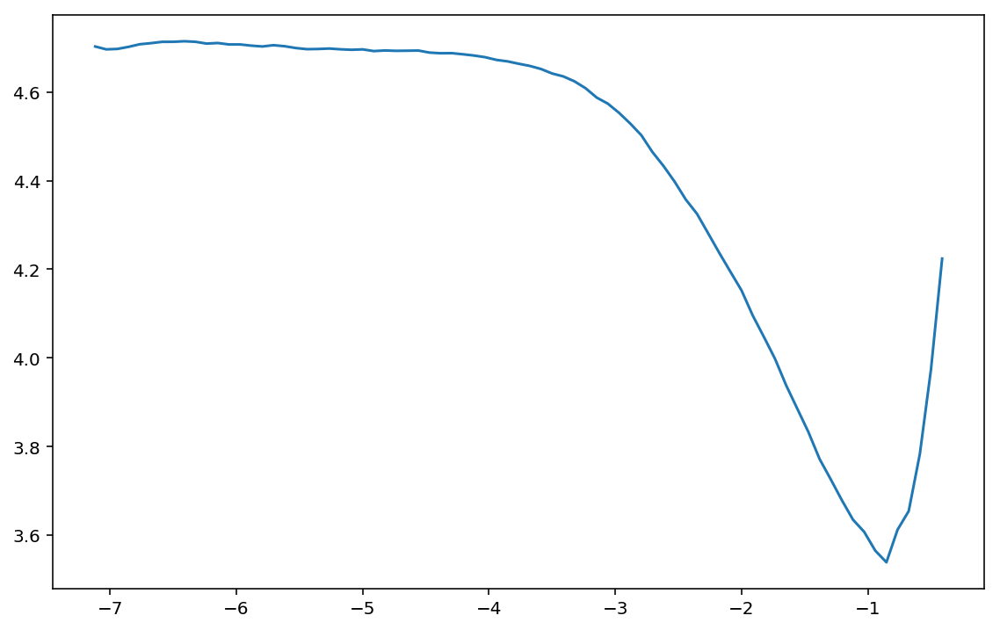

In [88]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(logs[10:-5],losses[10:-5])

### Leanring rate finder for inceptionresnetv2 with replacement layers:
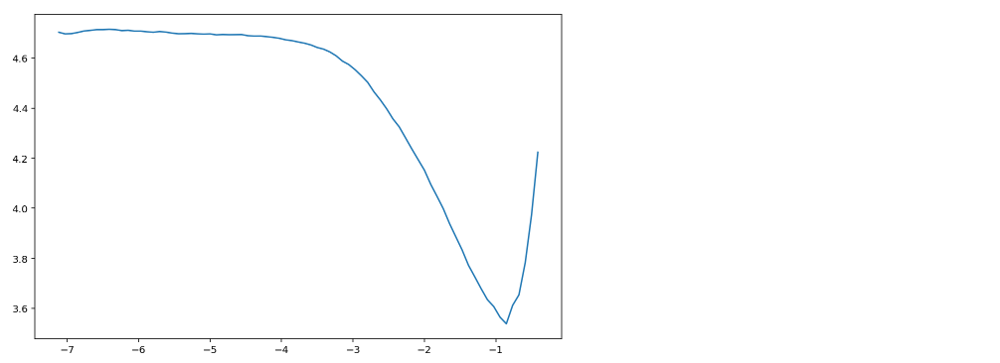

### Learning Rate finder for inceptionresnetv2:
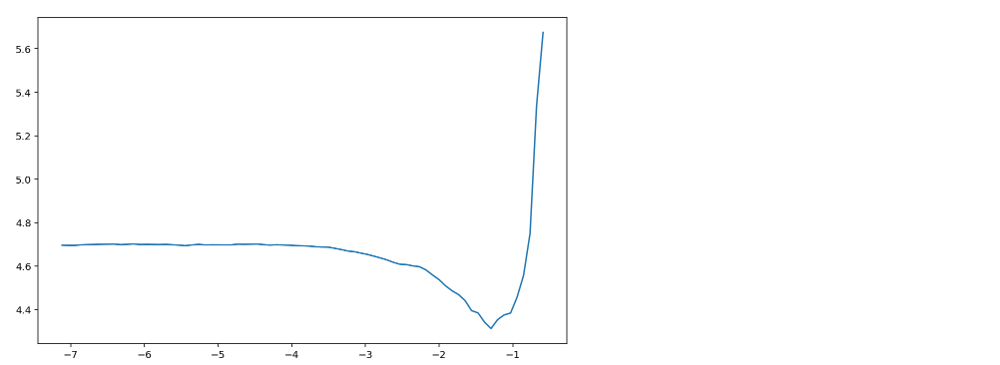

In [89]:
print("{:5f}".format(1e-2))
print("{:5f}".format(1e-3))
print("{:5f}".format(1e-4))

0.010000
0.001000
0.000100


In [90]:
learning_rate=0.01

In [91]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

## Train the model...

### Define tracking variables outside the program so that training can continue from the previous point

**Only run these if starting from scratch, otherwise preserve them**

Remove unwanted array elements if resetting back to an earlier epoch rather than starting again after the last one...

In [92]:
train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []

In [93]:
best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

### Manually Resetting to previous best epoch (AFTER loading below if neeeded) - customize and use as required

In [49]:
train_losses_bak = copy.deepcopy(train_losses)
valid_losses_bak = copy.deepcopy(valid_losses)
val_acc_history_bak = copy.deepcopy(val_acc_history)
lr_hist_bak = copy.deepcopy(lr_hist)

### If best epoch is 47 (was 18)...

In [50]:
val_acc_history[:47]

[0.8447432762836186,
 0.8899755501222494,
 0.8997555012224939,
 0.910757946210269,
 0.9205378973105135,
 0.9193154034229829,
 0.9266503667481663,
 0.9242053789731052,
 0.9339853300733496,
 0.9352078239608802,
 0.9303178484107579,
 0.9352078239608802,
 0.9364303178484108,
 0.9388753056234719,
 0.9437652811735942,
 0.9425427872860636,
 0.9339853300733496,
 0.9437652811735942,
 0.8936430317848411,
 0.9046454767726161,
 0.8936430317848411,
 0.9070904645476773,
 0.9046454767726161,
 0.9144254278728606,
 0.9229828850855746,
 0.9180929095354523,
 0.9144254278728606,
 0.9205378973105135,
 0.9278728606356969,
 0.9290953545232273,
 0.9266503667481663,
 0.9315403422982885,
 0.9376528117359413,
 0.9327628361858191,
 0.9327628361858191,
 0.9352078239608802,
 0.9339853300733496,
 0.941320293398533,
 0.9315403422982885,
 0.9339853300733496,
 0.9352078239608802,
 0.9352078239608802,
 0.9339853300733496,
 0.9352078239608802,
 0.9339853300733496,
 0.9303178484107579,
 0.9388753056234719]

In [51]:
train_losses = train_losses[:47]
valid_losses = valid_losses[:47]
val_acc_history = val_acc_history[:47]
lr_hist = lr_hist[:47]

In [52]:
best_acc = val_acc_history[-1]
best_acc

0.9388753056234719

In [53]:
best_epoch = 47 # 18

In [54]:
epoch_loss_min = valid_losses[-1]
epoch_loss_min

0.25789036678291477

In [55]:
lr_hist[-1]

[1.0000000000000002e-06]

In [472]:
print("{:7f}".format(*lr_hist[-1]))

0.000001


In [56]:
learning_rate = 0.000001

### End manual resetting...

In [103]:
use_weights

False

In [104]:
model_name=="inception"

False

In [58]:
model.to(device)

Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (1): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (2): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (5): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3,

In [431]:
## After 25 epochs it shows the learning rate is not really changing values, so reset and train again for another 50 epochs...
lr = 0.00001
# lr = 0.0001
for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [432]:
exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [9, 18, 27], gamma=0.1)

In [63]:
model = train_model(model, criterion, optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=False, 
                    use_weights=use_weights, 
                    num_epochs=33,
                    first_epoch=48,
                    ufilename="newclf_unfrozen",
                    is_inception=(model_name=="inception"))

Epoch 48/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.1057 Acc: 0.9666
valid Loss: 0.4429 Acc: 0.9205

Epoch 49/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.1013 Acc: 0.9699
valid Loss: 0.2618 Acc: 0.9340

Epoch 50/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0918 Acc: 0.9721
valid Loss: 0.4406 Acc: 0.9254

Epoch 51/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0932 Acc: 0.9713
valid Loss: 0.5872 Acc: 0.9132

Epoch 52/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0836 Acc: 0.9751
valid Loss: 0.3362 Acc: 0.9364

Epoch 53/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0760 Acc: 0.9777
valid Loss: 0.3324 Acc: 0.9291

Epoch 54/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0798 Acc: 0.9754
valid Loss: 0.4908 Acc: 0.9218

Epoch 55/80
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0729 Acc: 0.9786
valid Loss: 0.3751 Acc: 0.9279

Epoch 56

RuntimeError: CUDA error: out of memory

In [109]:
print("{:.6f}".format(1.0000e-05))

0.000010


### Print train vs validation losses

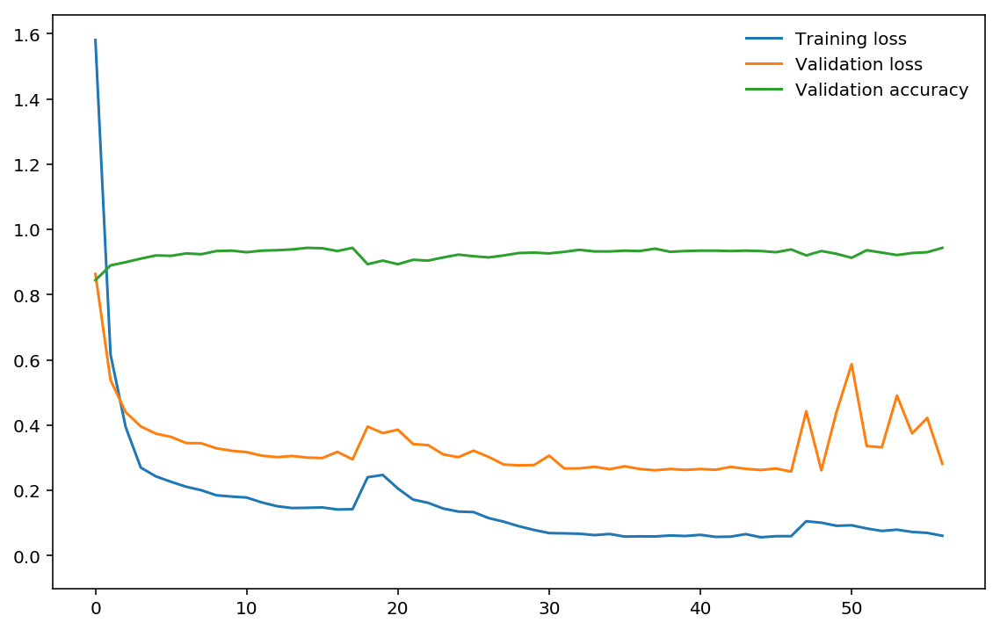

In [64]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses, label="Training loss")
plt.plot(valid_losses, label="Validation loss")
plt.plot(val_acc_history, label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

## Restarting training at 18 epochs, replacement layer...
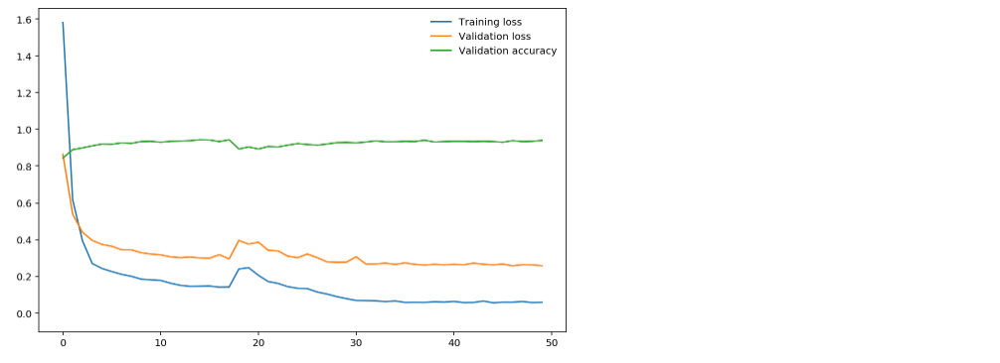

## Initial training with replacement layer
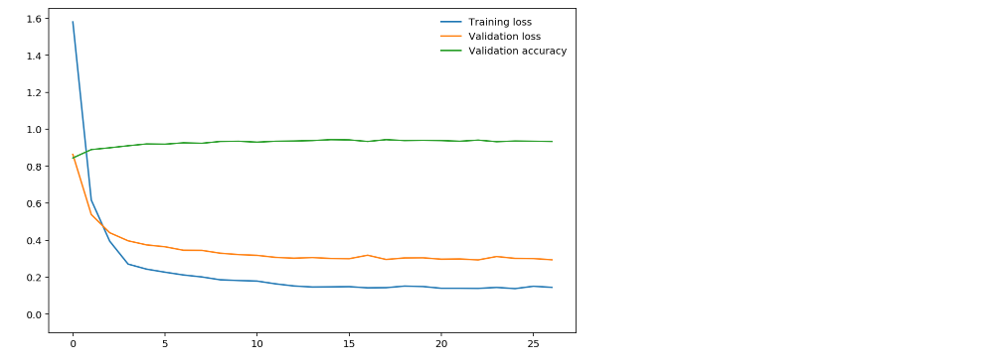

## Resuming training after 61 epochs...
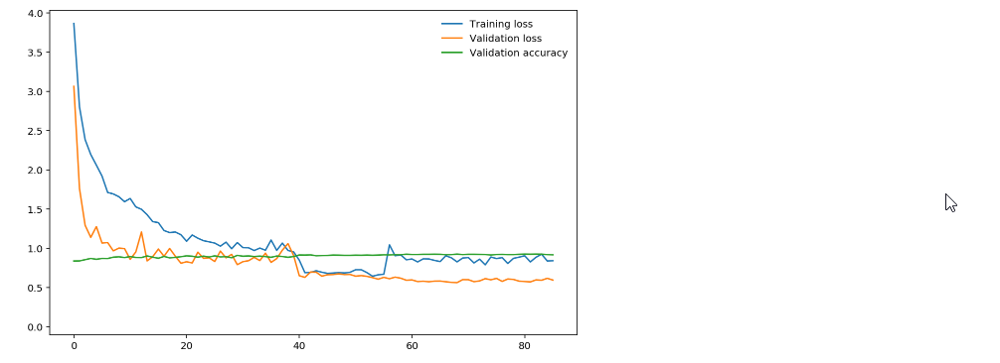

## Training without learning rate annealing
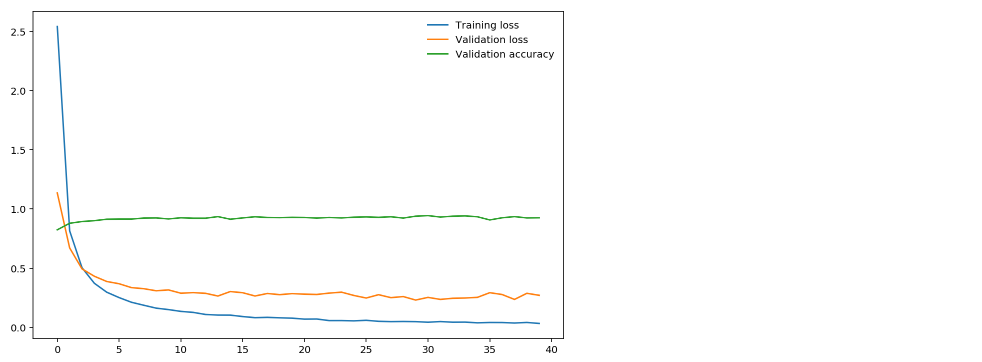

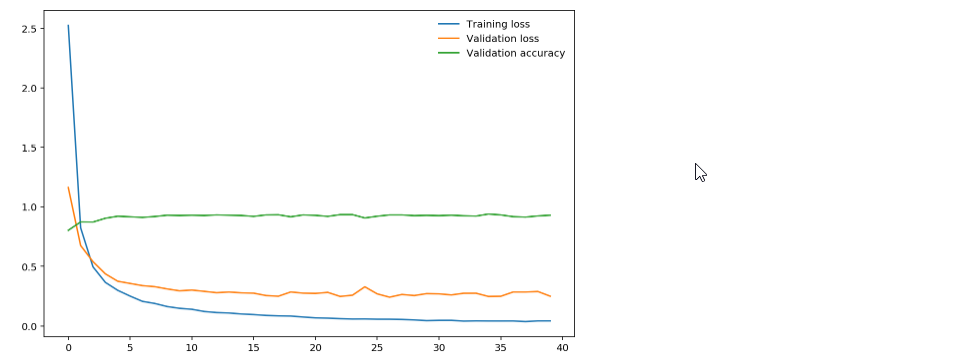

## Training with learning rate annealing

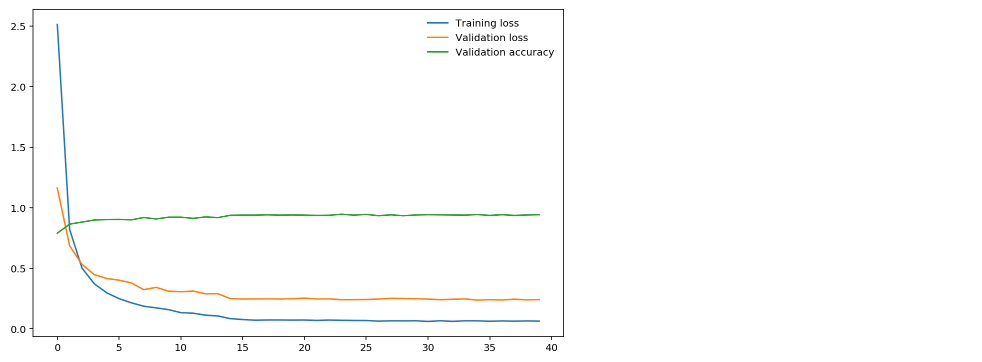

## Training with learning rate annealing and jitter augmentation
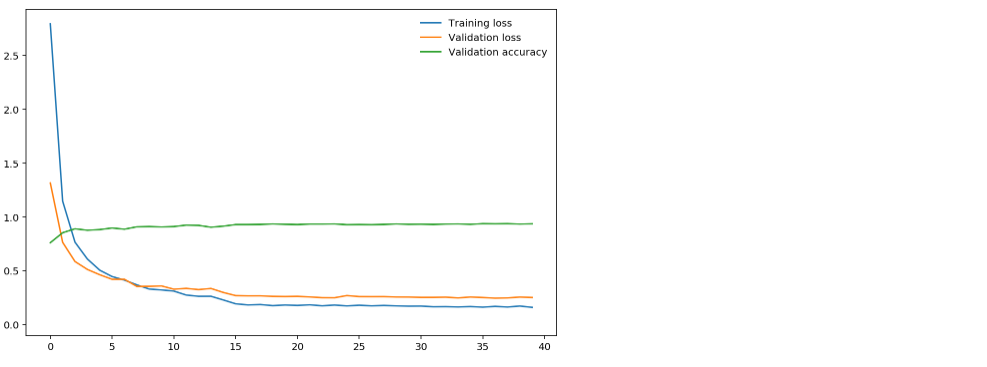

## Training with weights and no learning rate annealing
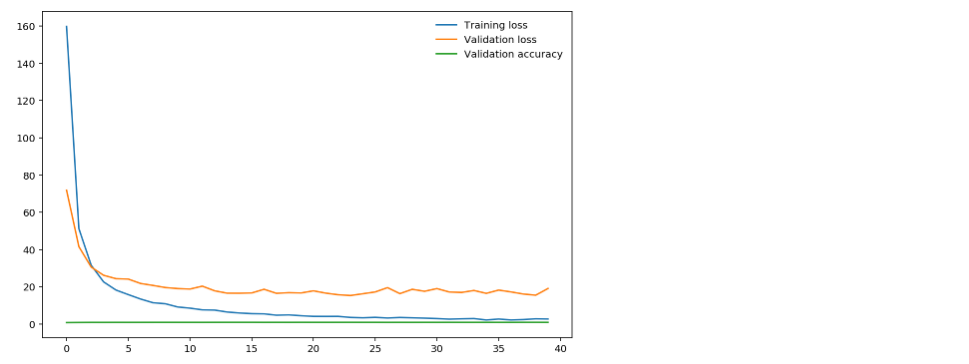

## Training with weights and jitter and lr annealing

### Corrected estimation of loss 

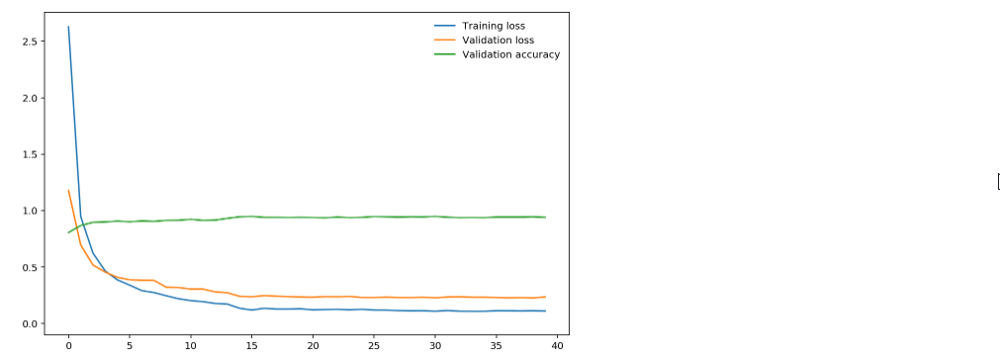

## Save the checkpoint

Now that your network is trained, save the model so you can load it later for making predictions. You probably want to save other things such as the mapping of classes to indices which you get from one of the image datasets: `image_datasets['train'].class_to_idx`. You can attach this to the model as an attribute which makes inference easier later on.

```model.class_to_idx = image_datasets['train'].class_to_idx```

Remember that you'll want to completely rebuild the model later so you can use it for inference. Make sure to include any information you need in the checkpoint. If you want to load the model and keep training, you'll want to save the number of epochs as well as the optimizer state, `optimizer.state_dict`. You'll likely want to use this trained model in the next part of the project, so best to save it now.

In [111]:
model.state_dict()

OrderedDict([('conv1.weight',
              tensor([[[[ 0.0133,  0.0147, -0.0154,  ..., -0.0409, -0.0430, -0.0708],
                        [ 0.0041,  0.0058,  0.0149,  ...,  0.0022, -0.0209, -0.0385],
                        [ 0.0223,  0.0236,  0.0161,  ...,  0.1028,  0.0626,  0.0520],
                        ...,
                        [-0.0009,  0.0278, -0.0101,  ..., -0.1272, -0.0766,  0.0078],
                        [ 0.0036,  0.0480,  0.0621,  ...,  0.0243, -0.0337, -0.0157],
                        [-0.0800, -0.0322, -0.0178,  ...,  0.0354,  0.0224,  0.0017]],
              
                       [[-0.0185,  0.0114,  0.0239,  ...,  0.0537,  0.0440, -0.0095],
                        [-0.0077,  0.0189,  0.0680,  ...,  0.1596,  0.1461,  0.1200],
                        [-0.0460, -0.0761, -0.0896,  ...,  0.1211,  0.1670,  0.1762],
                        ...,
                        [ 0.0288,  0.0137, -0.0838,  ..., -0.3808, -0.3041, -0.1397],
                        [ 0.0829,  0

## Reset to best saved state dicts based on accuracy...

(This is what is pushed back to model at the end of training)

### Or on loss - if we have a better loss with same accuracy...

(This requires loading model with best saved settings)

In [ ]:
del model

In [68]:
del optimizer

In [4]:
torch.cuda.empty_cache()

In [5]:
state_dict = torch.load('inceptionresnetv2_acc_newclf_unfrozen_57.pt')
opt_state_dict = torch.load('inceptionresnetv2_acc_newclf_unfrozen_57_optimizer.pt')                        

In [436]:
state_dict = torch.load('inceptionresnetv2_newclf_47.pt')
opt_state_dict = torch.load('inceptionresnetv2_newclf_47_optimizer.pt')                        

In [112]:
state_dict = torch.load('inceptionresnetv2_newclf_18.pt')
opt_state_dict = torch.load('inceptionresnetv2_newclf_18_optimizer.pt')                        

In [113]:
state_dict = torch.load('inceptionresnetv2_acc_schd_74.pt')
opt_state_dict = torch.load('inceptionresnetv2_acc_schd_74_optimizer.pt')

In [114]:
state_dict = torch.load('inception_acc_schd_61.pt')
opt_state_dict = torch.load('inception_acc_schd_61_optimizer.pt')

In [115]:
state_dict = torch.load('inception_acc_schd_35.pt')
opt_state_dict = torch.load('inception_acc_schd_35_optimizer.pt')

In [116]:
state_dict = torch.load('resnet50_acc_wgt_augmnt_16.pt')
opt_state_dict = torch.load('resnet50_acc_wgt_augmnt_16_optimizer.pt')

In [117]:
state_dict = torch.load('resnet50_wgt_augmnt_31.pt')
opt_state_dict = torch.load('resnet50_wgt_augmnt_31_optimizer.pt')

In [118]:
state_dict = torch.load('resnet50_acc_schd_aug_36.pt')
opt_state_dict = torch.load('resnet50_acc_schd_aug_36_optimizer.pt')

In [119]:
state_dict = torch.load('resnet50_acc_wgts_38.pt')
opt_state_dict = torch.load('resnet50_acc_wgts_38_optimizer.pt')

In [120]:
state_dict = torch.load('resnet50_acc_35.pt')
opt_state_dict = torch.load('resnet50_acc_35_optimizer.pt')

In [121]:
state_dict = torch.load('resnet50_30_nolrsched.pt')
opt_state_dict = torch.load('resnet50_30_optimizer_nolrsched.pt')

In [122]:
state_dict = torch.load('resnet50_acc_24.pt')
opt_state_dict = torch.load('resnet50_24_optimizer.pt')

In [123]:
state_dict = torch.load('resnet50_35.pt')
opt_state_dict = torch.load('resnet50_35_optimizer.pt')

In [124]:
state_dict = torch.load('resnet50_27.pt')
opt_state_dict = torch.load('resnet50_27_optimizer.pt')

## Reset to best saved state dicts based on loss or accuracy...

In [438]:
model.load_state_dict(state_dict)
optimizer.load_state_dict(opt_state_dict)

In [126]:
def compare_dicts(dict_1, dict_2):
    dicts_differ = 0
    for key_item_1, key_item_2 in zip(dict_1.items(), dict_2.items()):
        if torch.equal(key_item_1[1], key_item_2[1]):
            pass
        else:
            dicts_differ += 1
            if (key_item_1[0] == key_item_2[0]):
                print('Mismtach found at', key_item_1[0])
            else:
                raise Exception
                
    if dicts_differ == 0:
        print('State_Dicts match perfectly! :)')

In [439]:
compare_dicts(model.state_dict(), state_dict)

State_Dicts match perfectly! :)


In [6]:
checkpt = 'inceptionresnetv2_acc_newclf_unfrozen_57_model_and_opt.pth'

In [440]:
checkpt = 'inceptionresnetv2_newclf_47_model_and_opt.pth'

In [128]:
checkpt = 'inceptionresnetv2_newclf_18_model_and_opt.pth'

In [129]:
checkpt = 'inceptionresnetv2_acc_schd_74_model_and_opt.pth'

In [130]:
checkpt = 'inception_acc_schd_61_epochs_model_and_opt.pth'

In [131]:
checkpt = 'inception_acc_schd_35_epochs_model_and_opt.pth'

In [132]:
checkpt = 'resnet50_wgt_augmnt_16_epochs_model_and_opt.pth'

In [133]:
model.class_to_idx = image_datasets['train'].class_to_idx

In [7]:
best_epoch = 57# 47 # 18 ## 74 ## 61 ##35

In [9]:
torch.save({'model_statedict': state_dict,
            'optimizer_statedict': opt_state_dict, 
            'best_epoch': best_epoch},
          checkpt) 

In [442]:
torch.save({'model_statedict':model.state_dict(),
            'optimizer_statedict':optimizer.state_dict(), 
            'class_to_idx' : model.class_to_idx,
            'best_epoch'   : best_epoch,
            'train_losses' : train_losses, 
            'valid_losses' : valid_losses, 
            'val_acc_history' : val_acc_history, 
            'lr_hist'      : lr_hist}, 
           checkpt)

## Loading the checkpoint

At this point it's good to write a function that can load a checkpoint and rebuild the model. That way you can come back to this project and keep working on it without having to retrain the network.

In [136]:
train_on_gpu

True

### InceptionResNetv2

In [ ]:
state_dicts_name = 'inceptionresnetv2_acc_newclf_unfrozen_57_model_and_opt.pth'

In [29]:
state_dicts_name = 'inceptionresnetv2_newclf_47_model_and_opt.pth'

In [420]:
state_dicts_name = 'inceptionresnetv2_newclf_18_model_and_opt.pth'

In [138]:
state_dicts_name = 'inceptionresnetv2_acc_schd_74_model_and_opt.pth'

In [139]:
state_dicts_name = 'inception_acc_schd_61_epochs_model_and_opt.pth'

In [140]:
state_dicts_name = 'inception_acc_schd_35_epochs_model_and_opt.pth'

### Resnet50

In [141]:
state_dicts_name = 'resnet50_wgt_augmnt_16_epochs_model_and_opt.pth'

In [142]:
state_dicts_name = 'resnet50_wgt_augmnt_31_epochs_model_and_opt.pth'

In [143]:
state_dicts_name = 'resnet50_acc_36_epochs_aug_model_and_opt.pth'

In [144]:
state_dicts_name = 'resnet50_acc_38_epochs_wgts_model_and_opt.pth'

In [145]:
state_dicts_name = 'resnet50_acc_35_epochs_model_and_opt.pth'

In [146]:
state_dicts_name = 'resnet50_24_epochs_model_and_opt.pth'

In [147]:
state_dicts_name = 'resnet50_23_epochs_model_and_opt.pth'

In [30]:
state_dicts_name

'inceptionresnetv2_newclf_47_model_and_opt.pth'

In [31]:
# TODO: Write a function that loads a checkpoint and rebuilds the model
if train_on_gpu:
    state_dicts = torch.load(state_dicts_name)
else:
    state_dicts = torch.load(state_dicts_name, map_location='cpu')

#print(state_dict.keys())

In [32]:
state_dicts.keys()

dict_keys(['model_statedict', 'optimizer_statedict', 'class_to_idx', 'best_epoch', 'train_losses', 'valid_losses', 'val_acc_history', 'lr_hist'])

In [33]:
model.load_state_dict(state_dicts['model_statedict'])

In [36]:
optimizer.load_state_dict(state_dicts['optimizer_statedict'])

In [37]:
model.class_to_idx = state_dicts['class_to_idx']

In [38]:
best_epoch = 47 # 18 # 61

In [39]:
best_epoch = state_dicts['best_epoch']

In [40]:
best_epoch

47

In [41]:
len(state_dicts['lr_hist'])

50

In [42]:
lr_at_best = float(np.array(state_dicts['lr_hist'][best_epoch-1]))

In [43]:
print("{:.7f}".format(lr_at_best))

0.0000010


In [46]:
get_learning_rate(optimizer)

[1.0000000000000002e-06]

In [455]:
print("{:.7f}".format(1.0000000000000002e-06))

0.0000010


In [47]:
state_dicts['lr_hist'][:47]

[[0.001],
 [0.001],
 [0.001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000002e-06],
 [1.0000000000000002e-06]]

In [163]:
lr = 0.00001

In [164]:
use_weights

False

In [48]:
train_losses = state_dicts['train_losses']
valid_losses = state_dicts['valid_losses']
val_acc_history = state_dicts['val_acc_history']
lr_hist = state_dicts['lr_hist']

## Evaluate model - method 1

In [166]:
# track test loss 
# over 102 flower classes
test_loss = 0.0
class_correct = list(0. for i in range(102))
class_total = list(0. for i in range(102))

model.to(device)
model.eval() # eval mode

with torch.no_grad():
    # iterate over test data
    for data, target in dataloaders['valid']:

        # move tensors to GPU if CUDA is available
        data, target = data.to(device), target.to(device)

        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)

        # calculate the batch loss
        loss = criterion(output, target)

        # update  test loss 
        test_loss += loss.item() * (1 if use_weights==True else data.size(0))
        
        # print(loss.item(), loss.item() * (1 if use_weights==True else data.size(0)), test_loss)
        
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)    

        # compare predictions to true label
        correct_tensor = pred.eq(target.data.view_as(pred))
        correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())

        # calculate test accuracy for each object class
        for i in range(batch_size):
            if target.data.size(0) > i:
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1
                
# calculate avg test loss
test_loss = test_loss/len(dataloaders['valid'].dataset)                

In [167]:
accuracy_result = []

for i in range(102):
    if class_total[i] > 0:
        accuracy_result.append([idx_to_class[i], cat_to_name[idx_to_class[i]], 
                                np.sum(class_correct[i]), np.sum(class_total[i]),
                                100 * class_correct[i] / class_total[i]])
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

In [168]:
print(state_dicts_name)
print()
print('Report on Valid dataset')
print('-----------------------')
print('Test Loss: {:.6f}'.format(test_loss))
print('\nTest Accuracy (Overall): %0.2f%% (%2d/%2d)\n' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

sorted_accuracy = sorted(accuracy_result, key=lambda x: int(x[0]))
print('Accuracy per class: ')
for res in sorted_accuracy:
    print('{:<3} {:<30} {:>5}/{:<10} {:>10.2f}%'.format(res[0], res[1], res[2].astype(int), res[3].astype(int), res[4]))

inceptionresnetv2_acc_schd_74_model_and_opt.pth

Report on Valid dataset
-----------------------
Test Loss: 0.561982

Test Accuracy (Overall): 92.54% (757/818)

Accuracy per class: 
1   pink primrose                      7/8               87.50%
2   hard-leaved pocket orchid          6/6              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          3/6               50.00%
5   english marigold                   5/7               71.43%
6   tiger lily                         1/1              100.00%
7   moon orchid                        1/1              100.00%
8   bird of paradise                   5/5              100.00%
9   monkshood                          3/3              100.00%
10  globe thistle                      3/4               75.00%
11  snapdragon                         9/10              90.00%
12  colt's foot                        5/5              100.00%
13  king protea                        4/5        

### Also try test data...

In [169]:
# track test loss 
# over 102 flower classes
test_loss = 0.0
class_correct = list(0. for i in range(102))
class_total = list(0. for i in range(102))

model.to(device)
model.eval() # eval mode

with torch.no_grad():
    # iterate over test data
    for data, target in dataloaders['test']:

        # move tensors to GPU if CUDA is available
        data, target = data.to(device), target.to(device)

        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)

        # calculate the batch loss
        loss = criterion(output, target)
        
        # update  test loss 
        test_loss += loss.item() * (1 if use_weights==True else data.size(0))
        
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)    

        # compare predictions to true label
        correct_tensor = pred.eq(target.data.view_as(pred))
        correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())

        # calculate test accuracy for each object class
        for i in range(batch_size):
            if target.data.size(0) > i:
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1

# calculate avg test loss
test_loss = test_loss/len(dataloaders['test'].dataset)

In [170]:
accuracy_test_result = []

for i in range(102):
    if class_total[i] > 0:
        accuracy_test_result.append([idx_to_class[i], cat_to_name[idx_to_class[i]], 
                                np.sum(class_correct[i]), np.sum(class_total[i]),
                                100 * class_correct[i] / class_total[i]])
    else:
        print('Test Accuracy of %5s: N/A (no test examples)' % (classes[i]))

In [171]:
print(state_dicts_name)
print()
print('Report on Test dataset')
print('----------------------')
print('Test Loss: {:.6f}'.format(test_loss))
print('\nTest Accuracy (Overall): %0.2f%% (%2d/%2d)\n' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

sorted_test_accuracy = sorted(accuracy_test_result, key=lambda x: int(x[0]))
print('Accuracy per class: ')
for res in sorted_test_accuracy:
    print('{:<3} {:<30} {:>5}/{:<10} {:>10.2f}%'.format(res[0], res[1], res[2].astype(int), res[3].astype(int), res[4]))

inceptionresnetv2_acc_schd_74_model_and_opt.pth

Report on Test dataset
----------------------
Test Loss: 0.787771

Test Accuracy (Overall): 91.45% (749/819)

Accuracy per class: 
1   pink primrose                      4/5               80.00%
2   hard-leaved pocket orchid          5/5              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          3/6               50.00%
5   english marigold                   3/4               75.00%
6   tiger lily                         9/9              100.00%
7   moon orchid                        5/6               83.33%
8   bird of paradise                  10/10             100.00%
9   monkshood                          2/2              100.00%
10  globe thistle                      2/3               66.67%
11  snapdragon                         6/9               66.67%
12  colt's foot                        8/9               88.89%
13  king protea                        5/6          

### Evaluate model - method 2

In [172]:
class_name_map = np.vectorize(lambda x: cat_to_name[x])

In [173]:
idx_to_class_valid = {v:k for k, v in image_datasets["valid"].class_to_idx.items()}

In [174]:
def analyze_accuracy(model, device, idx_to_class, class_name_map, dataloaders, data):
    model.eval()
    model.to(device) 
    
    result = pd.DataFrame.from_dict(idx_to_class, orient="index").rename(columns={0: "class"})
    result["class_name"] = result["class"].apply(class_name_map)
    result["count"] = 0
    result["correct"] = 0
    iteration = 0
 
    print(state_dicts_name)
    print('-' * 80)
    print()
    
    with torch.no_grad():
        for data, target in dataloaders[data]:
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, pred = torch.max(output, 1)
            
#             correct_tensor = pred.eq(target.data.view_as(pred))
#             correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
            
            equality = (target.data == pred)

            np_labels = target.cpu().numpy()
            result["count"] = result["count"].add(pd.Series(np_labels).value_counts(), fill_value=0)
            result["correct"] = result["correct"].add(pd.Series(np_labels[np.where(equality)]).value_counts(), fill_value=0)

            iteration += 1

            print("Iteration {}".format(iteration))
            print("------------")
            print("Labels:")
            print(target.data)
            print("Predictions:")
            print(pred)
            print("Equality:")
            print(equality)
            
    print()
    print()
    print(state_dicts_name)
    print('-' * 50)
    result["accuracy"] = result["correct"] / result["count"]
    print("Top 5 class")
    display(result.sort_values("accuracy", ascending=False).head())
    print("Bottom 5 class")
    display(result.sort_values("accuracy", ascending=False).tail())
    overall_accuracy = result["correct"].sum() / result["count"].sum()
    print(f"Overall Accuracy: {overall_accuracy:.2%}")
    
    return result

In [175]:
result = analyze_accuracy(model, device, 
                          idx_to_class_valid, 
                          class_name_map, 
                          dataloaders, "valid")

inceptionresnetv2_acc_schd_74_model_and_opt.pth
--------------------------------------------------------------------------------

Iteration 1
------------
Labels:
tensor([ 74,  11,  97, 100,  99,  76,  83, 100,  89,  99,  54,  85,  75,  18,
         96,  89,  17,  33,  85,  89,  12,  53,  85,  16,  17,  43,  49,  77,
         28,  76,  73,  45,  53,  98,  90,  54,  64,   5,  90,  18,  49,  43,
         98,  12,  37,   1,  76,  57,  21,  76,  60,  51,  76,  70,  32,  40,
         72,  38, 101,  75,  68,  56,  39,  12], device='cuda:0')
Predictions:
tensor([ 74,  11,  97, 100,  99,  76,  83, 100,  89,  99,  54,  85,  75,  18,
         96,  78,  17,  33,  85,  89,  12,  53,  85,  16,  53,  43,  75,  77,
         28,  42,  73,  45,  53,  98,  90,  54,  64,   5,  90,  18,  49,  43,
         98,  12,  37,   1,  76,  57,  21,  76,  60,  51,  76,  70,  32,  13,
         72,  38, 101,  75,  85,  56,  39,  12], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,

        82, 37, 12, 47, 73, 82, 95, 49, 50, 83], device='cuda:0')
Equality:
tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
        0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Iteration 9
------------
Labels:
tensor([ 98,  14,  82,  88,  78,  61,   6,  96,   0, 100,  53,   0,  73,  12,
         49,  47,  83,  93,  56,  98,  60,  67,  81,  52,  56,  59,  12,  49,
         93,  51,   7,  40,  17,  49,  49,  50,  78,  24,  43,  41,  51,  98,
         23,  80,  95,  92,  77,  95,  72,  17,  74,  42,  24,  43,  94,  59,
          3,  82,  83,  18,   5,  77,  74,  26], device='cuda:0')
Predictions:
tensor([ 98,  14,  15,  88,  78,  61,   6,  96,  90, 100,  53,   0,  73,  12,
         49,  47,  83,  93,  56,  98,  60,  67,  81,  52,  56,  59,  12,  49,
         93,  49,  77,  40,  17,  49,  49,  50,  78,  24,  43,  41,  51,  98,
      

,class,class_name,count,correct,accuracy
101,99,bromelia,6.0,6.0,1.0
77,77,passion flower,21.0,21.0,1.0
35,39,siam tulip,3.0,3.0,1.0
85,84,columbine,10.0,10.0,1.0
74,74,rose,15.0,15.0,1.0


Bottom 5 class


,class,class_name,count,correct,accuracy
30,34,mexican aster,7.0,4.0,0.571429
27,31,carnation,2.0,1.0,0.500000
32,36,ruby-lipped cattleya,6.0,3.0,0.500000
36,4,sweet pea,6.0,3.0,0.500000
13,19,balloon flower,4.0,2.0,0.500000


Overall Accuracy: 92.54%


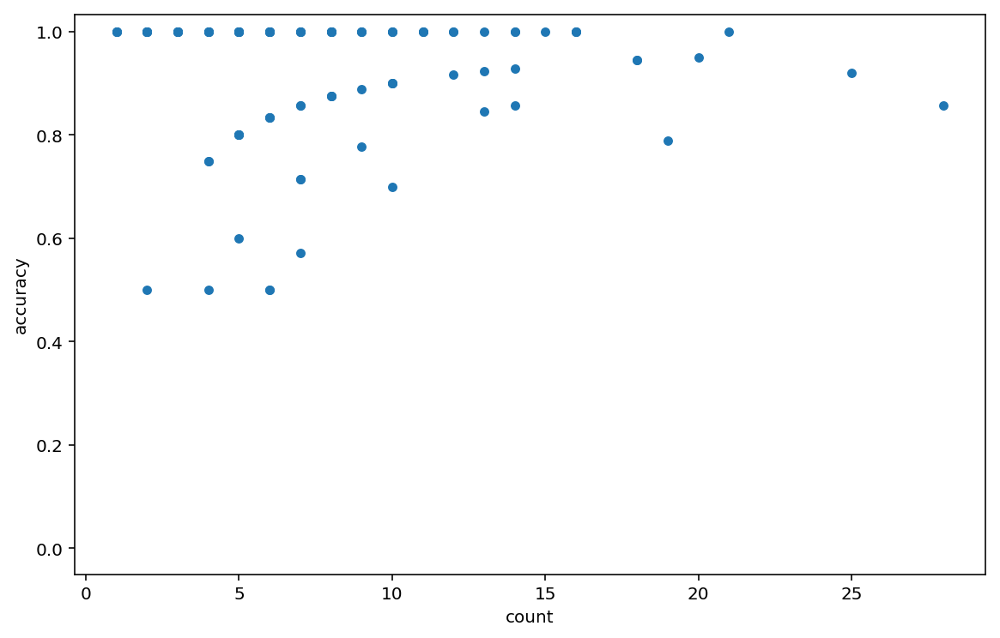

In [176]:
plt.rcParams['figure.figsize'] = [9.5, 6]

result.plot.scatter(x="count", y="accuracy")
plt.ylim(ymin=-0.05)  
plt.show()

### Evaluate model - method 3

In [177]:
def calc_accuracy(model, data):
    model.eval()
    model.to(device)    
    mean_list = []
    
    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(dataloaders[data]):
            inputs, labels = inputs.to(device), labels.to(device)
            
            # obtain the outputs from the model
            outputs = model.forward(inputs)
            # max provides the (maximum probability, max value)
            probs, predicted = outputs.max(dim=1)
            
            # check the 
            if idx == 0:
                print(predicted) #the predicted class
                #print(torch.exp(probs)) # the predicted probability
                print(torch.exp(torch.softmax(probs, dim=0)))
            
            equals = predicted == labels.data
            
            if idx == 0:
                print(equals)
            
            mean_list.append(equals.float().mean())
            
            print(equals.float().mean())
   
    print()
    print('Mean of all batches: {0:.4f}'.format(sum(mean_list) / len(mean_list)))

In [178]:
calc_accuracy(model, 'valid')

tensor([92, 78, 26, 12, 28, 50, 45, 82, 84, 99, 30, 19, 42, 64, 35, 82, 49, 89,
        93, 89, 46, 90, 11, 54, 97, 43, 90, 85, 83, 82, 56, 42, 11,  3, 93, 23,
        43, 43, 94, 19, 70, 17, 41, 34,  9,  7, 49,  0,  1, 34, 82, 66, 70, 45,
         0, 23, 95, 73, 89,  4, 33, 43, 36, 77], device='cuda:0')
tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 2.7183, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000], device='cuda:0')
tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
        1, 1, 1, 1, 

In [179]:
calc_accuracy(model, 'test')

tensor([ 0,  0,  0, 99,  0, 17,  1,  1,  2,  2,  2, 94,  2,  2,  2,  2,  3,  3,
         3,  3,  4,  4,  4,  4,  4,  4,  5, 36,  5,  5,  5,  5, 36, 96,  5,  6,
         6, 18,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7, 24,  8,  8,  8,  9,
         9,  9,  9, 10, 10, 10, 11, 11, 11, 11], device='cuda:0')
tensor([1.0001, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 2.7178, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000], device='cuda:0')
tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 0, 

In the output we have:
- The predicted flower type in the first tensor.
- The probability associated with how sure the model is that it has predicted the correct flower type.
- The truth of whether the model was actually correct or not.
- The accuracy for each batch.

# Inference for classification

Now you'll write a function to use a trained network for inference. That is, you'll pass an image into the network and predict the class of the flower in the image. Write a function called `predict` that takes an image and a model, then returns the top $K$ most likely classes along with the probabilities. It should look like 

```python
probs, classes = predict(image_path, model)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

First you'll need to handle processing the input image such that it can be used in your network. 

## Image Preprocessing

You'll want to use `PIL` to load the image ([documentation](https://pillow.readthedocs.io/en/latest/reference/Image.html)). It's best to write a function that preprocesses the image so it can be used as input for the model. This function should process the images in the same manner used for training. 

First, resize the images where the shortest side is 256 pixels, keeping the aspect ratio. This can be done with the [`thumbnail`](http://pillow.readthedocs.io/en/3.1.x/reference/Image.html#PIL.Image.Image.thumbnail) or [`resize`](http://pillow.readthedocs.io/en/3.1.x/reference/Image.html#PIL.Image.Image.thumbnail) methods. Then you'll need to crop out the center 224x224 portion of the image.

Color channels of images are typically encoded as integers 0-255, but the model expected floats 0-1. You'll need to convert the values. It's easiest with a Numpy array, which you can get from a PIL image like so `np_image = np.array(pil_image)`.

As before, the network expects the images to be normalized in a specific way. For the means, it's `[0.485, 0.456, 0.406]` and for the standard deviations `[0.229, 0.224, 0.225]`. You'll want to subtract the means from each color channel, then divide by the standard deviation. 

And finally, PyTorch expects the color channel to be the first dimension but it's the third dimension in the PIL image and Numpy array. You can reorder dimensions using [`ndarray.transpose`](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.ndarray.transpose.html). The color channel needs to be first and retain the order of the other two dimensions.

**See these for ideas:**

https://github.com/craig-martinson/aipnd-project

https://medium.com/@josh_2774/deep-learning-with-pytorch-9574e74d17ad

In [180]:
def resize_image(image, size):
    ''' Resize image so shortest side is 'size' pixels,
        maintain aspect ratio  
    '''
    w, h = image.size
    
    # print("into resize:", w, h)
    
    if h > w:
        # Set width to 'size' and scale height to maintain aspect ratio
        h = int(max(h * size / w, 1))
        w = int(size)
    else:
        # Set height to 'size' and scale width to maintain aspect ratio
        w = int(max(w * size / h, 1))
        h = int(size)
    
    # print("resize:", image.resize((w, h))) 
    
    return image.resize((w, h))


def crop_image(image, size):
    ''' Return a cropped square region from centre of image
    '''
    w, h = image.size
    x0 = (w - size) / 2
    y0 = (h - size) / 2
    x1 = x0 + size
    y1 = y0 + size
    
    # print("crop:", image.crop((x0, y0, x1, y1)))
    
    return image.crop((x0, y0, x1, y1))

def process_image(image_path, max_sz=256, img_sz=224):
    ''' 
    Scales, crops, and normalizes a PIL image for a PyTorch       
    model, returns an Numpy array
    '''
    # Open the image
    from PIL import Image
    img = Image.open(image_path)
    
    # Resize image so shortest side is 256 pixels (341 is standard for inception)
    img = resize_image(img, max_sz)
    
    # Crop image
    img = crop_image(img, img_sz)

    # Normalize
    img = np.array(img)/255
    
    mean = np.array([0.485, 0.456, 0.406]) #provided mean
    std = np.array([0.229, 0.224, 0.225]) #provided std
    
    img = (img - mean)/std
    
    # Move color channels to first dimension as expected by PyTorch
    # PIL assumes is the third dimension    
    img = img.transpose((2, 0, 1))
    
    return img

To check your work, the function below converts a PyTorch tensor and displays it in the notebook. If your `process_image` function works, running the output through this function should return the original image (except for the cropped out portions).

In [181]:
testimg = process_image('flower_data/train/12/image_03999.jpg', 343, 299)

In [182]:
type(testimg)

numpy.ndarray

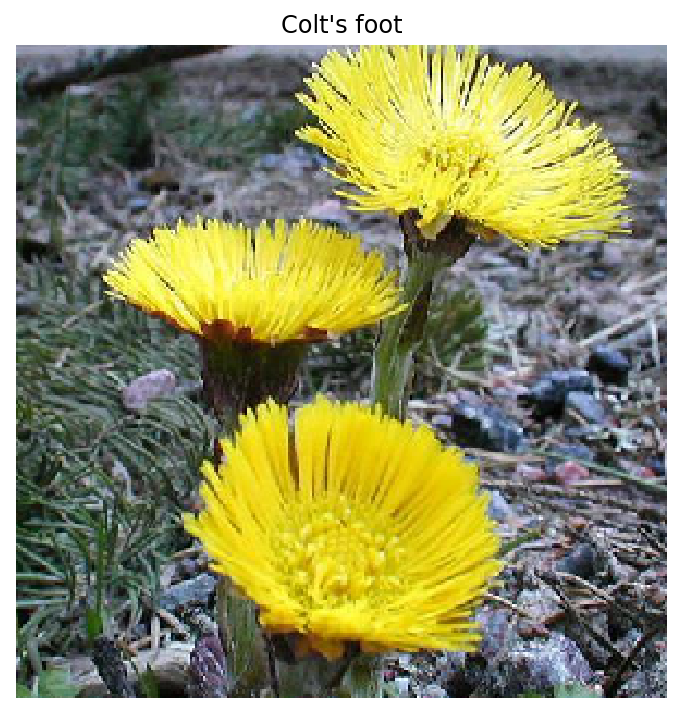

In [183]:
imshow(testimg, title="Colt's foot")

## Class Prediction

Once you can get images in the correct format, it's time to write a function for making predictions with your model. A common practice is to predict the top 5 or so (usually called top-$K$) most probable classes. You'll want to calculate the class probabilities then find the $K$ largest values.

To get the top $K$ largest values in a tensor use [`x.topk(k)`](http://pytorch.org/docs/master/torch.html#torch.topk). This method returns both the highest `k` probabilities and the indices of those probabilities corresponding to the classes. You need to convert from these indices to the actual class labels using `class_to_idx` which hopefully you added to the model or from an `ImageFolder` you used to load the data ([see here](#Save-the-checkpoint)). Make sure to invert the dictionary so you get a mapping from index to class as well.

Again, this method should take a path to an image and a model checkpoint, then return the probabilities and classes.

```python
probs, classes = predict(image_path, model)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

In [184]:
def predict(image_path, model, topk=5, max_sz=256, img_sz=224):
    ''' Predict the class (or classes) of an image using a trained deep learning model.
    '''
    img = process_image(image_path, max_sz, img_sz)
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    
    # the first argument when passing an image tensor to the model needs to be the batch size 
    # for an individual image, using unsqueeze_(0) to add a 1 as the first argument of the tensor
    img_tensor.unsqueeze_(0)
    
    model.cpu()
    model.eval()
    
    with torch.no_grad():
        # Use softmax since model is returning raw logits due to not having a softmax layer...
        log_ps = torch.softmax(model.forward(img_tensor), dim=1)
        probs, classes = torch.topk(log_ps, k=topk)
        ## probs_exp = torch.exp(probs) 
        ## total_prob_exp = np.sum(torch.exp(log_ps).detach().numpy())
        ## probs = (probs_exp.detach().numpy() / total_prob_exp).tolist()[0]
        
        probs = probs.detach().numpy().tolist()[0]
        classes = classes.detach().numpy().tolist()[0]

        idx_to_class =  {y:x for x,y in model.class_to_idx.items()}
        classes = [idx_to_class[ii] for ii in classes]
        classnames = [cat_to_name[cls] for cls in classes]
        
    return probs, classes, classnames 

In [185]:
imgpth = 'flower_data/train/12/image_03999.jpg'

In [186]:
img = process_image(imgpth, 343, 299)

In [187]:
img, len(img), img.shape

(array([[[ 0.34806062,  0.31381111,  0.27956161, ...,  0.29668636,
           0.29668636,  0.29668636],
         [ 0.57068242,  0.51930816,  0.50218341, ...,  0.22818734,
           0.2453121 ,  0.26243685],
         [ 0.41655964,  0.38231013,  0.34806062, ...,  0.19393784,
           0.19393784,  0.22818734],
         ...,
         [-0.73079887, -0.66229985, -0.62805035, ..., -0.1999315 ,
          -0.69654936, -0.18280675],
         [-0.55955133, -0.6451751 , -0.61092559, ..., -1.84390787,
          -0.35405429,  0.14256358],
         [-0.81642264, -0.52530182, -0.83354739, ..., -1.10754345,
          -1.50141279, -0.25130576]],
 
        [[ 0.53781513,  0.50280112,  0.46778711, ...,  0.66036415,
           0.66036415,  0.66036415],
         [ 0.74789916,  0.69537815,  0.67787115, ...,  0.64285714,
           0.66036415,  0.67787115],
         [ 0.62535014,  0.59033613,  0.55532213, ...,  0.60784314,
           0.60784314,  0.64285714],
         ...,
         [-0.07492997,  0.1351540

In [188]:
img_tensor = torch.from_numpy(img).type(torch.FloatTensor)

In [189]:
img_tensor

tensor([[[ 0.3481,  0.3138,  0.2796,  ...,  0.2967,  0.2967,  0.2967],
         [ 0.5707,  0.5193,  0.5022,  ...,  0.2282,  0.2453,  0.2624],
         [ 0.4166,  0.3823,  0.3481,  ...,  0.1939,  0.1939,  0.2282],
         ...,
         [-0.7308, -0.6623, -0.6281,  ..., -0.1999, -0.6965, -0.1828],
         [-0.5596, -0.6452, -0.6109,  ..., -1.8439, -0.3541,  0.1426],
         [-0.8164, -0.5253, -0.8335,  ..., -1.1075, -1.5014, -0.2513]],

        [[ 0.5378,  0.5028,  0.4678,  ...,  0.6604,  0.6604,  0.6604],
         [ 0.7479,  0.6954,  0.6779,  ...,  0.6429,  0.6604,  0.6779],
         [ 0.6254,  0.5903,  0.5553,  ...,  0.6078,  0.6078,  0.6429],
         ...,
         [-0.0749,  0.1352,  0.2577,  ...,  0.1877, -0.3200,  0.1702],
         [ 0.0476,  0.1176,  0.2402,  ..., -1.4230,  0.0651,  0.5378],
         [ 0.0476,  0.3452,  0.0476,  ..., -0.9503, -1.3354,  0.0301]],

        [[ 1.0888,  1.0539,  1.0191,  ...,  1.2108,  1.2108,  1.2108],
         [ 1.3328,  1.2805,  1.2631,  ...,  1

In [190]:
test_img = img_tensor.unsqueeze(0)

In [191]:
len(test_img), test_img.shape

(1, torch.Size([1, 3, 300, 299]))

In [192]:
img_tensor.unsqueeze_(0)

tensor([[[[ 0.3481,  0.3138,  0.2796,  ...,  0.2967,  0.2967,  0.2967],
          [ 0.5707,  0.5193,  0.5022,  ...,  0.2282,  0.2453,  0.2624],
          [ 0.4166,  0.3823,  0.3481,  ...,  0.1939,  0.1939,  0.2282],
          ...,
          [-0.7308, -0.6623, -0.6281,  ..., -0.1999, -0.6965, -0.1828],
          [-0.5596, -0.6452, -0.6109,  ..., -1.8439, -0.3541,  0.1426],
          [-0.8164, -0.5253, -0.8335,  ..., -1.1075, -1.5014, -0.2513]],

         [[ 0.5378,  0.5028,  0.4678,  ...,  0.6604,  0.6604,  0.6604],
          [ 0.7479,  0.6954,  0.6779,  ...,  0.6429,  0.6604,  0.6779],
          [ 0.6254,  0.5903,  0.5553,  ...,  0.6078,  0.6078,  0.6429],
          ...,
          [-0.0749,  0.1352,  0.2577,  ...,  0.1877, -0.3200,  0.1702],
          [ 0.0476,  0.1176,  0.2402,  ..., -1.4230,  0.0651,  0.5378],
          [ 0.0476,  0.3452,  0.0476,  ..., -0.9503, -1.3354,  0.0301]],

         [[ 1.0888,  1.0539,  1.0191,  ...,  1.2108,  1.2108,  1.2108],
          [ 1.3328,  1.2805,  

In [193]:
model.cpu()
model.eval()

InceptionResNetV2(
  (conv2d_1a): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2a): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2b): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2d_3b): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_4a): 

In [194]:
with torch.no_grad():
    log_ps = torch.softmax(model.forward(img_tensor), dim=1)

In [195]:
log_ps

tensor([[1.0156e-23, 3.5727e-28, 4.1485e-25, 9.9363e-24, 6.9187e-34, 1.3541e-29,
         1.0000e+00, 4.7741e-18, 1.7182e-17, 2.4443e-26, 1.7004e-33, 1.3668e-16,
         1.1230e-18, 1.8383e-26, 3.1971e-24, 2.6810e-29, 3.0717e-34, 3.1208e-23,
         6.5168e-33, 2.6475e-29, 4.0747e-27, 6.3879e-23, 2.1388e-26, 1.5172e-24,
         1.3507e-22, 7.1124e-32, 2.3968e-22, 2.2498e-18, 1.1868e-28, 1.4167e-28,
         1.2956e-32, 3.4392e-22, 1.6266e-22, 1.0381e-29, 6.1883e-27, 1.4294e-27,
         5.0101e-23, 7.5536e-25, 2.9017e-25, 6.5325e-33, 3.3411e-30, 4.9284e-41,
         8.4992e-22, 5.1160e-27, 2.0345e-26, 2.6869e-26, 2.1537e-30, 8.4955e-21,
         1.3120e-15, 2.2887e-21, 1.8927e-29, 8.7651e-30, 5.6498e-23, 1.4052e-32,
         6.4224e-35, 3.1753e-31, 3.6747e-39, 5.7742e-35, 1.7390e-42, 3.2868e-30,
         5.8719e-41, 1.6015e-24, 2.9904e-42, 2.9497e-42, 5.9730e-29, 7.8879e-42,
         1.3720e-22, 3.0557e-24, 6.0296e-23, 6.8548e-33, 7.2621e-24, 3.2339e-23,
         1.6640e-26, 2.4333e

In [196]:
max(log_ps.detach().tolist()[0])

1.0

In [197]:
log_ps[0][6]

tensor(1.)

In [198]:
torch.exp(log_ps[0][6])

tensor(2.7183)

In [199]:
probs, classes = torch.topk(log_ps, k=5)

In [200]:
probs

tensor([[1.0000e+00, 1.3120e-15, 1.3668e-16, 1.7182e-17, 4.7741e-18]])

In [201]:
[1.0000e+00, 1.3120e-15, 1.3668e-16, 1.7182e-17, 4.7741e-18]

[1.0, 1.312e-15, 1.3668e-16, 1.7182e-17, 4.7741e-18]

In [202]:
for prob in probs.detach().tolist()[0]:
    print("{} --> {:12f}".format(prob, prob))
    #print("{:12f}".format(prob))

1.0 -->     1.000000
1.3120154952978112e-15 -->     0.000000
1.3668059803096332e-16 -->     0.000000
1.7181616657522704e-17 -->     0.000000
4.774075800481943e-18 -->     0.000000


In [203]:
classes

tensor([[ 6, 48, 11,  8,  7]])

In [204]:
probs_exp = torch.exp(probs)
probs_exp

tensor([[2.7183, 1.0000, 1.0000, 1.0000, 1.0000]])

In [205]:
imgpth = 'flower_data/train/12/image_03999.jpg'
pred = predict(imgpth, model, 5, 343, 299)

In [206]:
print(pred)
print()
print(pred[0])
for prob in pred[0]:
    print("{} --> {:12f}".format(prob, prob))
print()
print(pred[1])
print()
print(pred[2])

([1.0, 1.3120154952978112e-15, 1.3668059803096332e-16, 1.7181616657522704e-17, 4.774075800481943e-18], ['12', '50', '17', '14', '13'], ["colt's foot", 'common dandelion', 'purple coneflower', 'spear thistle', 'king protea'])

[1.0, 1.3120154952978112e-15, 1.3668059803096332e-16, 1.7181616657522704e-17, 4.774075800481943e-18]
1.0 -->     1.000000
1.3120154952978112e-15 -->     0.000000
1.3668059803096332e-16 -->     0.000000
1.7181616657522704e-17 -->     0.000000
4.774075800481943e-18 -->     0.000000

['12', '50', '17', '14', '13']

["colt's foot", 'common dandelion', 'purple coneflower', 'spear thistle', 'king protea']


## Sanity Checking

Now that you can use a trained model for predictions, check to make sure it makes sense. Even if the validation accuracy is high, it's always good to check that there aren't obvious bugs. Use `matplotlib` to plot the probabilities for the top 5 classes as a bar graph, along with the input image. It should look like this:

<img src='assets/inference_example.png' width=300px>

You can convert from the class integer encoding to actual flower names with the `cat_to_name.json` file (should have been loaded earlier in the notebook). To show a PyTorch tensor as an image, use the `imshow` function defined above.

In [207]:
def plot_solution(image_path, model, topk=5, max_sz=256, img_sz=224):
    # Set up plot
    plt.figure(figsize = (4,10))
    ax = plt.subplot(2,1,1)

    # Set up title
    flower_num = image_path.split('/')[2]
    title_ = cat_to_name[flower_num]

    # Plot flower
    img = process_image(image_path, max_sz, img_sz)
    imshow(img, ax, title = title_);
    
    # Make prediction
    probs, labs, flowers = predict(image_path, model, topk, max_sz, img_sz) 

    # Plot bar chart
    plt.subplot(2,1,2)
    sns.barplot(x=probs, y=flowers, color=sns.color_palette()[0]);
    #ax1.set_xlim(0, 1.05)
    
    plt.show()

In [208]:
image_path = 'flower_data/valid/28/image_05258.jpg'
probs, labs, flowers = predict(image_path, model, 5, 343, 299) 

In [209]:
print(probs)
print(labs)
print(flowers)

[0.988257110118866, 0.011730371043086052, 6.898629180795979e-06, 5.422898993856506e-06, 2.0047140480983217e-07]
['28', '72', '75', '51', '82']
['stemless gentian', 'azalea', 'thorn apple', 'petunia', 'clematis']


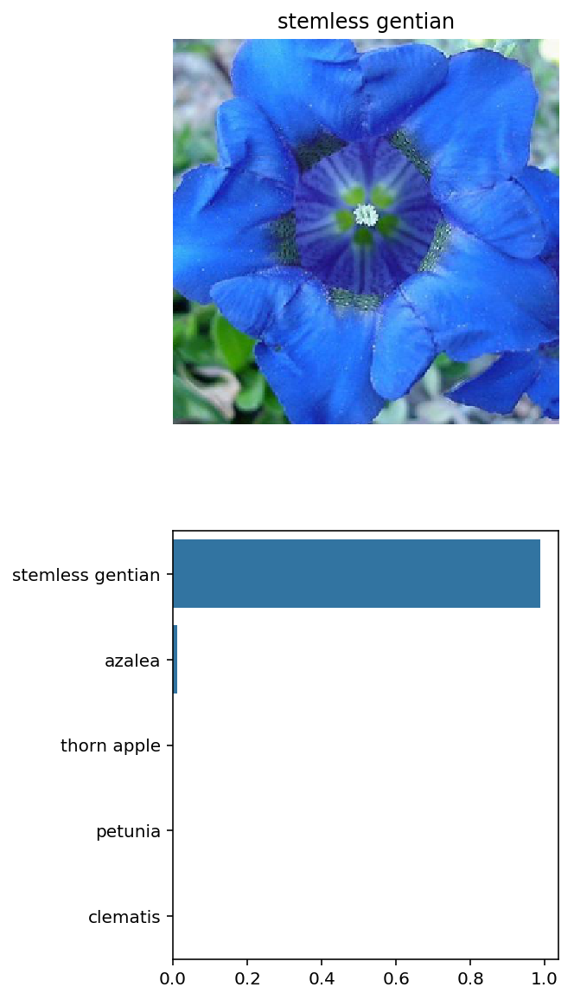

In [210]:
image_path = 'flower_data/valid/28/image_05258.jpg'
plot_solution(image_path, model, 5, 343, 299)

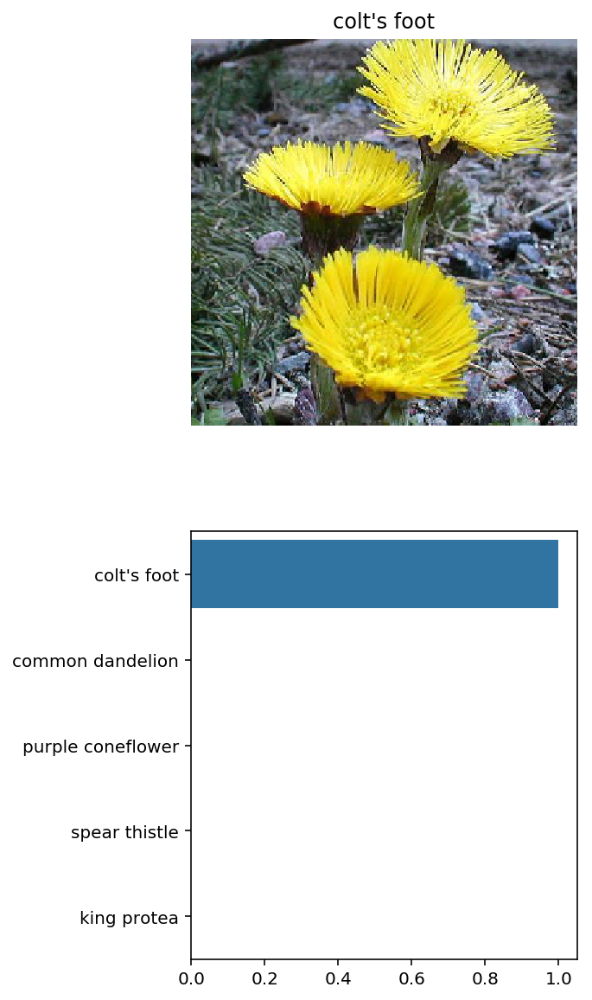

In [211]:
plot_solution('flower_data/train/12/image_03999.jpg', model, 5, 343, 299)

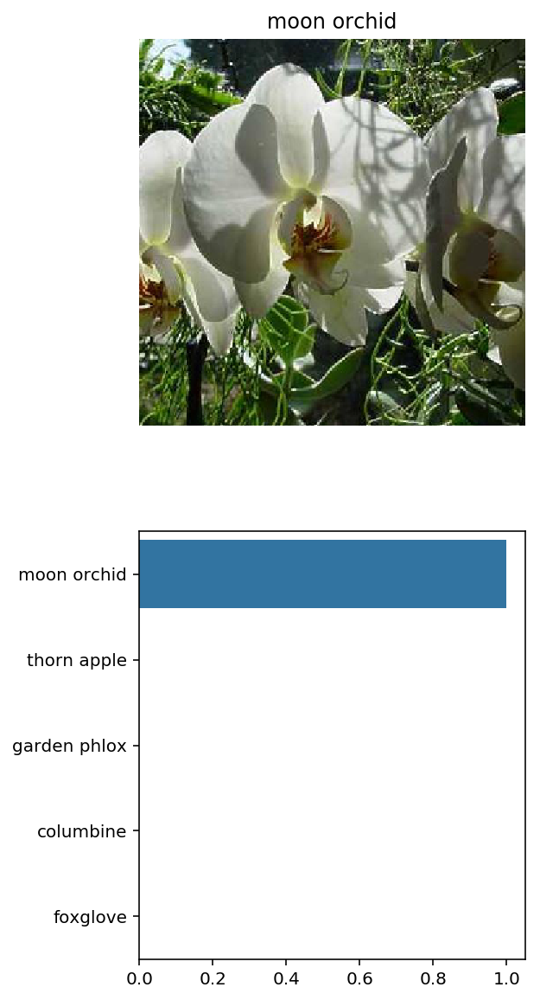

In [212]:
plot_solution('flower_data/valid/7/image_07216.jpg', model, 5, 343, 299)

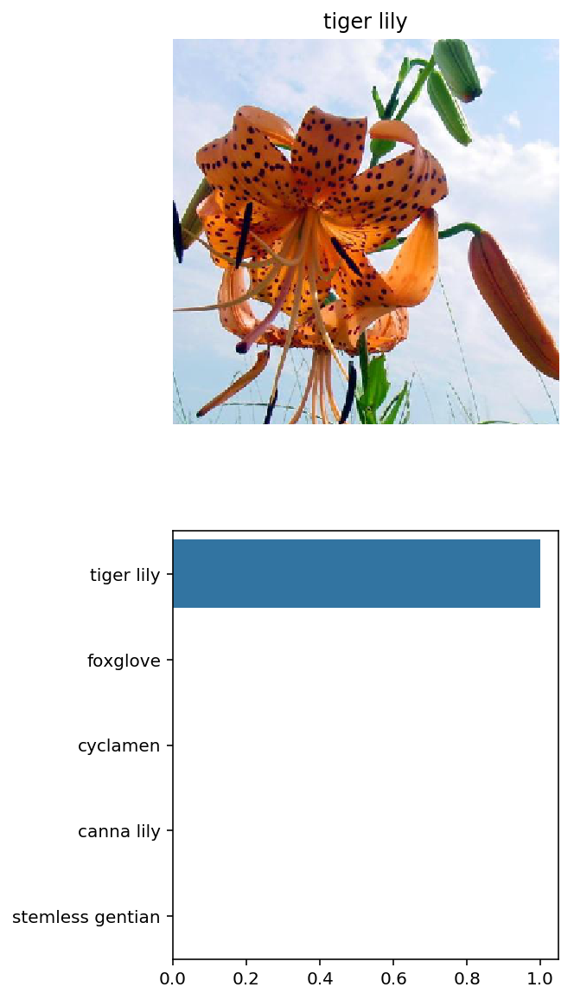

In [213]:
plot_solution('flower_data/valid/6/image_08105.jpg', model, 5, 343, 299)

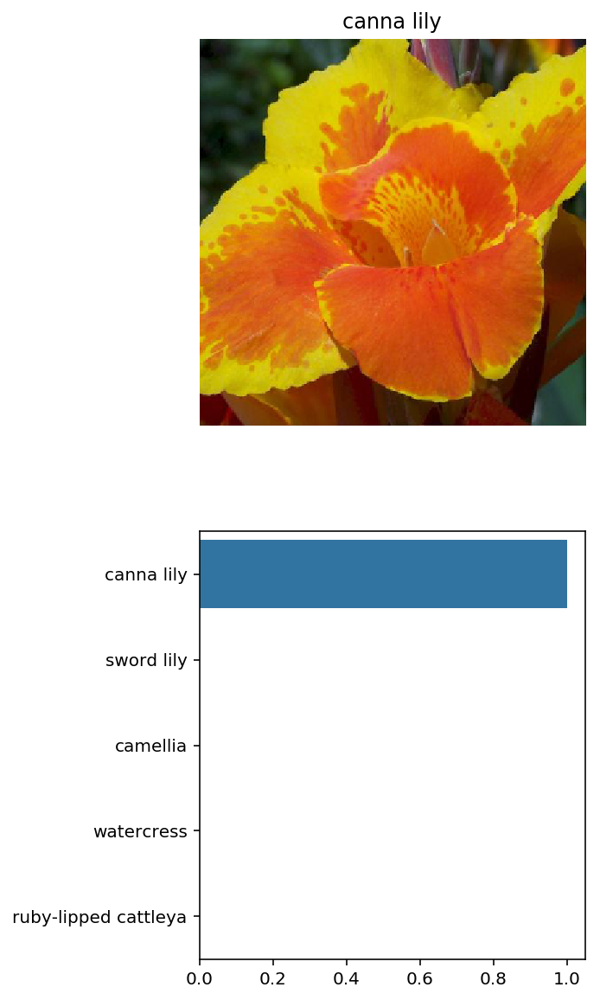

RuntimeError: Given input size: (1536x8x7). Calculated output size: (1536x1x0). Output size is too small at c:\programdata\miniconda3\conda-bld\pytorch_1533096106539\work\aten\src\thnn\generic/SpatialAveragePooling.c:64

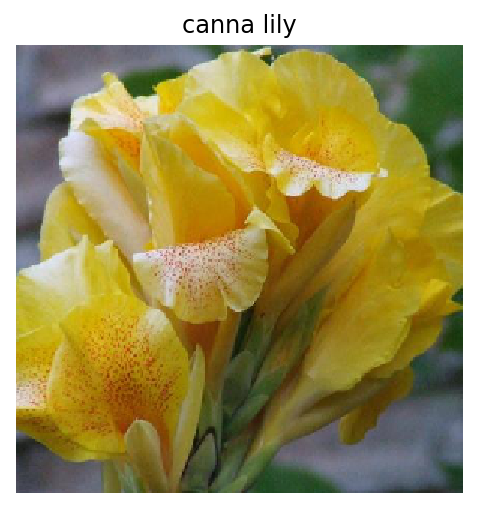

In [214]:
foldername = 'flower_data/valid/90/'
files = os.listdir(foldername)

for imgname in files:
    img = foldername + imgname
    plot_solution(img, model, 5, 343, 299)

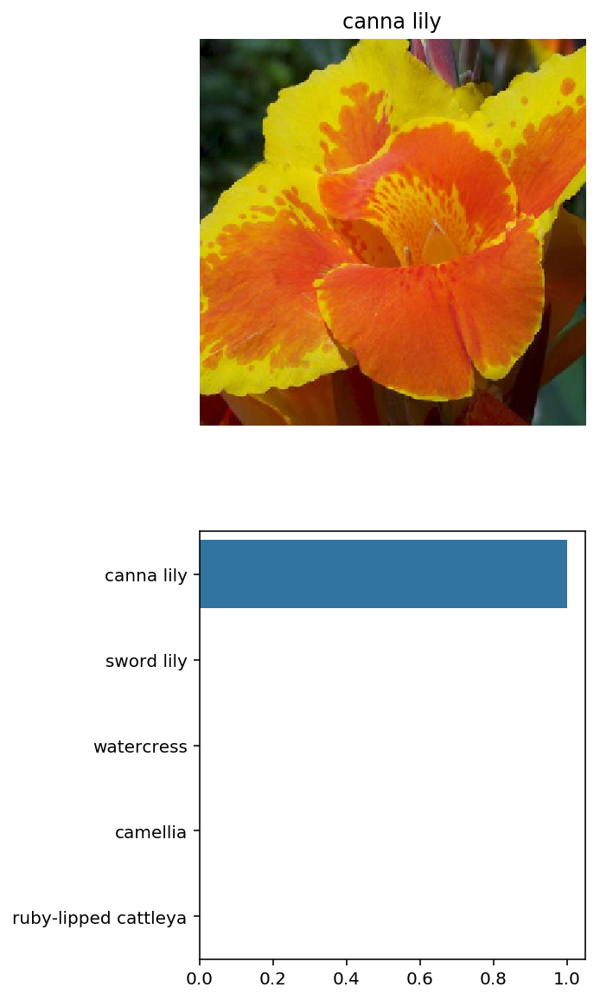

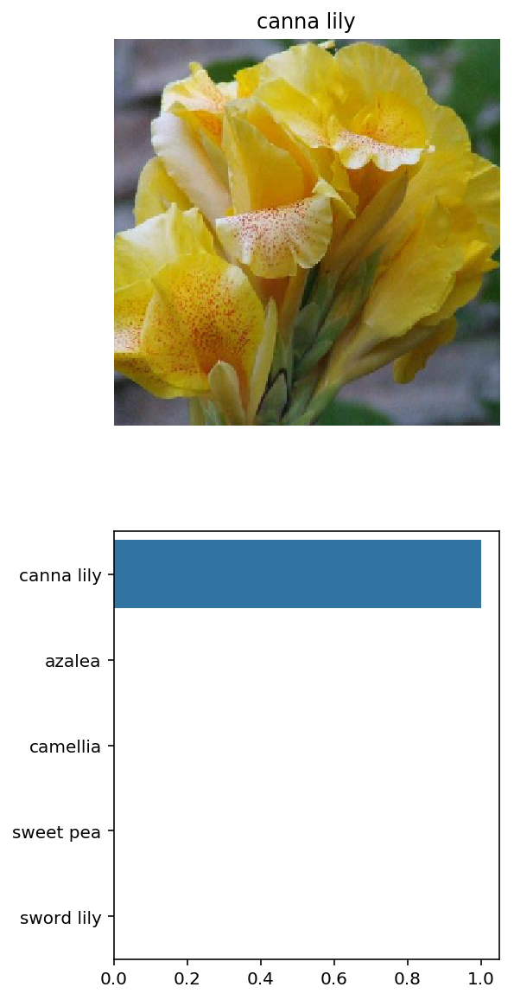

In [215]:
foldername = 'flower_data/valid/90/'
files = os.listdir(foldername)

for imgname in files:
    img = foldername + imgname
    plot_solution(img, model, 5, 344, 299)

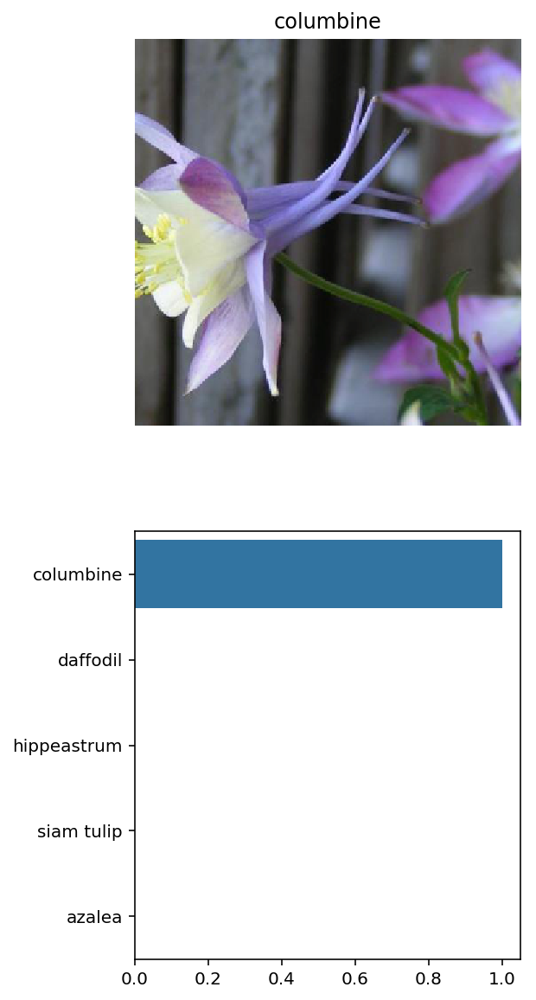

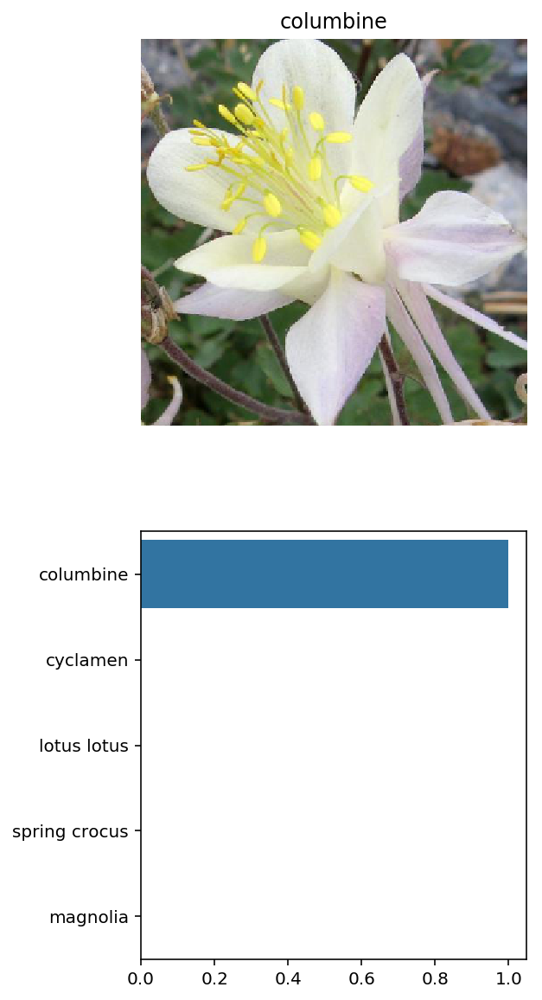

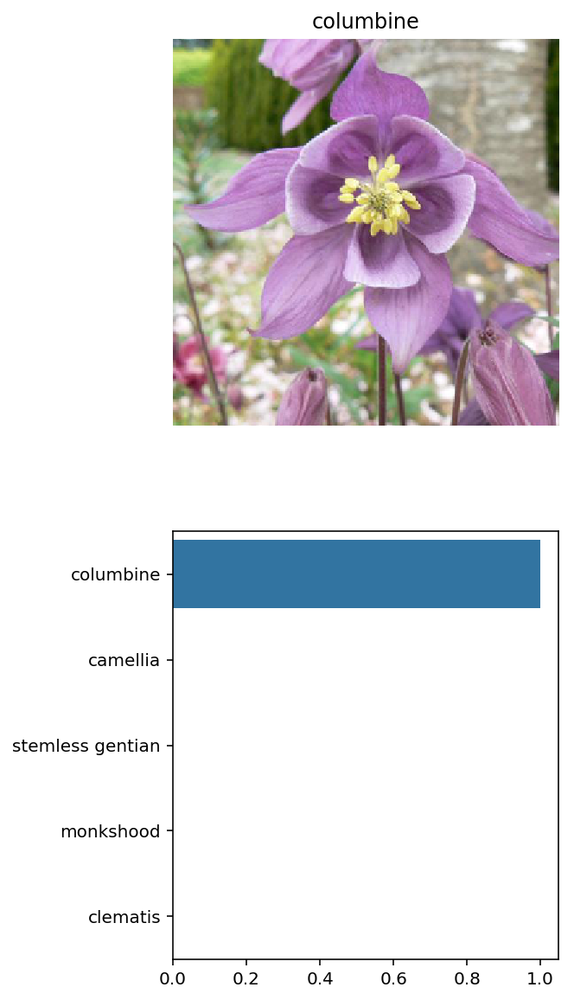

RuntimeError: Given input size: (1536x8x7). Calculated output size: (1536x1x0). Output size is too small at c:\programdata\miniconda3\conda-bld\pytorch_1533096106539\work\aten\src\thnn\generic/SpatialAveragePooling.c:64

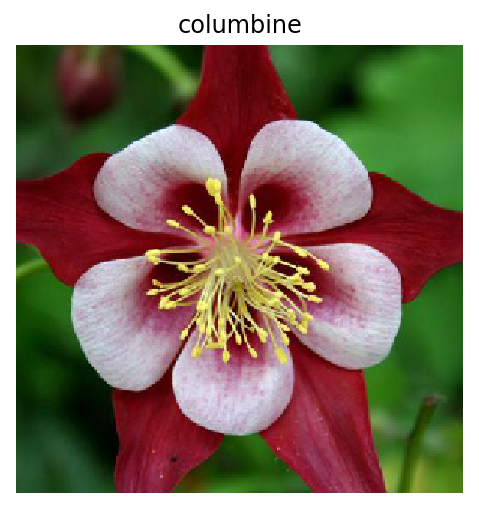

In [216]:
foldername = 'flower_data/valid/84/'
files = os.listdir(foldername)

for imgname in files:
    img = foldername + imgname
    plot_solution(img, model, 5, 343, 299)

# Appendix

In [217]:
%%javascript

// Sourced from http://nbviewer.jupyter.org/gist/minrk/5d0946d39d511d9e0b5a

$("#renumber-button").parent().remove();

function renumber() {
    // renumber cells in order
    var i=1;
    IPython.notebook.get_cells().map(function (cell) {
        if (cell.cell_type == 'code') {
            // set the input prompt
            cell.set_input_prompt(i);
            // set the output prompt (in two places)
            cell.output_area.outputs.map(function (output) {
                if (output.output_type == 'execute_result') {
                    output.execution_count = i;
                    cell.element.find(".output_prompt").text('Out[' + i + ']:');
                }
            });
            i += 1;
        }
    });
}

IPython.toolbar.add_buttons_group([{
  'label'   : 'Renumber',
  'icon'    : 'fa-list-ol',
  'callback': renumber,
  'id'      : 'renumber-button'
}]);

<IPython.core.display.Javascript object>

## Loading for evaluation:
```
import torch
import torch.nn as nn
from torchvision import models

# If you used something other than 224x224 cropped images, set the correct size here
image_size = 224
# Values you used for normalizing the images. Default here are for 
# pretrained models from torchvision.
norm_mean = [0.485, 0.456, 0.406]
norm_std = [0.229, 0.224, 0.225]

# adapted from fastai...
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=None):
        super().__init__()
        sz = sz or (1,1)
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return x

def get_resnet_model(modelname='resnet50', swap=False, sm=False):
    if modelname == 'resnet18':
        model = models.resnet18(pretrained=True)   
    elif modelname == 'resnet34':    
        model = models.resnet34(pretrained=True)   
    elif modelname == 'resnet50':    
        model = models.resnet50(pretrained=True)
    elif modelname == 'resnet101':    
        model = models.resnet101(pretrained=True)
    elif modelname == 'resnet152':    
        model = models.resnet152(pretrained=True)
    else:
        model = models.resnet50(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False    

    clf_input_size = model.fc.in_features
    clf_output_size = 102 # len(class_names)
    nf = clf_input_size * 2 # For flattening ...

    if swap==True:
        # swapping last 2 layers for new ones - adaptive max pooling and more layers
        # per the fastai resnet implementation...
        Resnetlayers = []
        Resnetlayers.append(AdaptiveConcatPool2d())
        Resnetlayers.append(Flatten())
        Resnetlayers.append(nn.BatchNorm1d(nf, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=nf, out_features=512, bias=True))
        Resnetlayers.append(nn.ReLU())
        Resnetlayers.append(nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=512, out_features=clf_output_size, bias=True))        
        if sm==True:
            Resnetlayers.append(nn.LogSoftmax())

        Resnetlist = list(model.children())[:-2] + Resnetlayers
        model = torch.nn.Sequential(*Resnetlist)
    else:    
        # standard replacing the fc layer to suit the number of classes
        classifier = nn.Linear(clf_input_size, clf_output_size)
        model.fc = classifier

    state_dicts_name = '/home/workspace/resnet152_wgts_53.pt'

    # Loading only the original state dict file
    state_dict = torch.load(state_dicts_name, map_location='cpu')
    model.load_state_dict(state_dict, strict=False)

    # Use these for an assembled state dicts definition
    #state_dicts = torch.load(state_dicts_name, map_location='cpu')
    #model.load_state_dict(state_dicts['model_statedict'], strict=False)

    return model 

model = get_resnet_model('resnet152', swap=True)

```

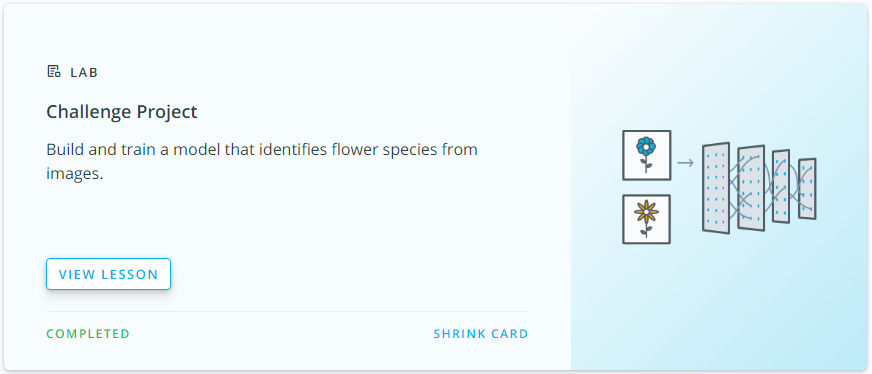